In [1]:
import pandas as pd
import numpy as np
import os

import geopandas as gpd
#from geopandas.tools import sjoin
#from shapely.geometry import Point

import matplotlib.pyplot as plt
#to horizontally align the plot axes and the legend axes and change the width
from mpl_toolkits.axes_grid1 import make_axes_locatable 


%matplotlib inline

This notebook is a precursor of analysis for later, more polished work.
The aim of this notebook is to pull in several types of data for the city of Chicago. I'll look at demographic data, crime data, transportation, business data, and rental listings in order to determine some insights about the different areas to live in the city.

Ultimately the goal is to build an app that will take these different data into consideration to help a user figure out what areas of the city they would like to live in.

However, I'll take the opportunity to play around with the data and practice different data/ml techniques along the way as I explore the data.

Data Sources

Biz Licenses
https://data.cityofchicago.org/Community-Economic-Development/Business-Licenses-Current-Active/uupf-x98q
This page will give some context about the business licenses dataset. May need some NLP to get better categorizations
about what kind of businesses these are

Crime
https://data.cityofchicago.org/Public-Safety/Crimes-2020/qzdf-xmn8

L Stops
https://data.cityofchicago.org/Transportation/CTA-System-Information-List-of-L-Stops/8pix-ypme

Boundaries - Community Areas and Zip
https://data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-Community-Areas-current-/cauq-8yn6
https://data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-ZIP-Codes/gdcf-axmw

National Historical GIS (NHGIS)
https://www.nhgis.org
Block Group and tract level info for: Race, edu attainment, median hh income, and employment status

Rental listings were scraped from realtor.com using a script I wrote.

In [2]:
#os.getcwd()

In [3]:
data_path = "~/Documents/Data_Science_Projects/Chicago_Tool/Data/"

cta_df = pd.read_csv(data_path + "CTA_-_System_Information_-_List_of__L__Stops.csv")
crime_df = pd.read_csv(data_path + "Crimes_-_2020.csv")
census_df = pd.read_csv(data_path + "nhgis0012_csv/nhgis0012_ds254_20215_blck_grp.csv")
biz_df = pd.read_csv(data_path + "Business_Licenses_-_Current_Active.csv")
rental_df = pd.read_csv(data_path + "Chicago_Rentals_Sample_Oct1923.csv")

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
""" Census dictionary for column names 
"""
census_dic = {"AON5E001":"pop_total", "AON5E002":"pop_white", "AON5E003":"pop_black", "AON5E005":"pop_asian", "AON5E007":"pop_other",
 "AON5E008":"pop_mixed",
              "AOOCE001":"hisp_total", "AOOCE012": "is_hispanic",
 "AOP8E001": "edu_total", "AOP8E017":"edu_hsgrad", "AOP8E022":"edu_bachelor",
 "AOQIE001": "income_medhh",
 "AOSJE001": "emp_total", "AOSJE002":"emp_inLF", "AOSJE004":"emp_employed", "AOSJE005":"emp_unemployed","AOSJE006":"emp_army"
}

In [5]:
# includes masters, professional degree and phD
census_df["edu_>bachelor"] = census_df["AOP8E023"] + census_df["AOP8E024"] + census_df["AOP8E025"]

# includes native americans and pacific islanders
census_df["pop_native"] = census_df["AON5E004"] + census_df["AON5E006"]

In [6]:
census_df.rename(columns=census_dic, inplace = True)

In [7]:
#census_df.iloc[:,20:30]

census_df=census_df[["GISJOIN", "STUSAB", "COUNTY","TRACTA", "BLKGRPA", "GEO_ID",
           "pop_total", "pop_white", "pop_black","hisp_total", "is_hispanic", "pop_asian", "pop_native", "pop_other", "pop_mixed",
           "edu_total", "edu_hsgrad", "edu_bachelor", "edu_>bachelor",
           "income_medhh",
           "emp_total", "emp_inLF", "emp_employed", "emp_unemployed", "emp_army"
          ]]

In [8]:
census_df = census_df[census_df["COUNTY"] == "Cook County"]
len(census_df)

4002

In [9]:
# to sync formatting with blkGrp sf, TRACTA & BLKGPA need to be strings and TRACTA needs 6 characters. Add 0 in front

census_df["TRACTA"] = census_df["TRACTA"].astype(str)
census_df["BLKGRPA"] = census_df["BLKGRPA"].astype(str)

trct_lst=[]
for i in census_df["TRACTA"]:
    if len(i) < 6:
        correction = (6-len(i)) * "0"
        new_tract = correction + i
    else:
        new_tract = i
    trct_lst.append(new_tract)
    
census_df["TRACTA"] =trct_lst

In [10]:
census_df.head()

,GISJOIN,STUSAB,COUNTY,TRACTA,BLKGRPA,GEO_ID,pop_total,pop_white,pop_black,hisp_total,...,edu_total,edu_hsgrad,edu_bachelor,edu_>bachelor,income_medhh,emp_total,emp_inLF,emp_employed,emp_unemployed,emp_army
494,G17003100101001,IL,Cook County,010100,1,1500000US170310101001,434,228,57,434,...,399,103,52,129,76797.0,434,350,334,16,0
495,G17003100101002,IL,Cook County,010100,2,1500000US170310101002,2116,674,1228,2116,...,1232,214,385,107,22179.0,1552,976,891,85,0
496,G17003100101003,IL,Cook County,010100,3,1500000US170310101003,1984,1103,466,1984,...,1654,121,561,444,67371.0,1924,1504,1418,86,0
497,G17003100102011,IL,Cook County,010201,1,1500000US170310102011,2175,681,807,2175,...,1445,311,208,286,58068.0,1714,1223,1112,111,0
498,G17003100102012,IL,Cook County,010201,2,1500000US170310102012,2057,561,856,2057,...,1154,212,291,150,41936.0,1406,961,945,16,0


In [11]:
# count missing values per column
missing_col = [census_df[i].isna().sum() for i in census_df.columns]
#census_df.isna().sum( axis=0)

missing_perc = [i/len(census_df) for i in missing_col]
missing_perc_df = pd.DataFrame({"col_name": census_df.columns, "prop_missing": missing_perc}).sort_values(by=['prop_missing'], ascending=False)

missing_perc_df

,col_name,prop_missing
19,income_medhh,0.081459
0,GISJOIN,0.000000
13,pop_other,0.000000
23,emp_unemployed,0.000000
22,emp_employed,0.000000
21,emp_inLF,0.000000
20,emp_total,0.000000
18,edu_>bachelor,0.000000
17,edu_bachelor,0.000000
16,edu_hsgrad,0.000000


In [12]:
# About 8% of rows are missing income
# are there any rows with 0 for income? No
print(census_df[census_df.income_medhh == 0])

Empty DataFrame
Columns: [GISJOIN, STUSAB, COUNTY, TRACTA, BLKGRPA, GEO_ID, pop_total, pop_white, pop_black, hisp_total, is_hispanic, pop_asian, pop_native, pop_other, pop_mixed, edu_total, edu_hsgrad, edu_bachelor, edu_>bachelor, income_medhh, emp_total, emp_inLF, emp_employed, emp_unemployed, emp_army]
Index: []

[0 rows x 25 columns]


In [13]:
# Since there are no incomes of 0 in the data, replace the na's with 0 for now
census_df.loc[census_df["income_medhh"].isna(), "income_medhh"] = 0


In [14]:
census_df.columns

Index(['GISJOIN', 'STUSAB', 'COUNTY', 'TRACTA', 'BLKGRPA', 'GEO_ID',
       'pop_total', 'pop_white', 'pop_black', 'hisp_total', 'is_hispanic',
       'pop_asian', 'pop_native', 'pop_other', 'pop_mixed', 'edu_total',
       'edu_hsgrad', 'edu_bachelor', 'edu_>bachelor', 'income_medhh',
       'emp_total', 'emp_inLF', 'emp_employed', 'emp_unemployed', 'emp_army'],
      dtype='object')

# Explore the Data

We have features dealing with population race, education level, income, and employment status at the census block group level (a census block is the smallest geographic census unit)

Are there any:
* interesting relationships
* outliers
* feature transformations that could be more insightful

In [15]:
census_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
pop_total,4002.0,1315.691654,614.407331,0.0,889.00,1207.0,1645.75,10528.0
pop_white,4002.0,684.665667,535.564711,0.0,254.00,630.0,1001.00,3445.0
pop_black,4002.0,302.658671,456.952559,0.0,2.25,72.5,453.00,6944.0
hisp_total,4002.0,1315.691654,614.407331,0.0,889.00,1207.0,1645.75,10528.0
is_hispanic,4002.0,336.568966,439.793750,0.0,38.00,155.0,453.75,3353.0
pop_asian,4002.0,99.158171,189.165255,0.0,0.00,23.0,111.00,1797.0
pop_native,4002.0,6.230635,24.317590,0.0,0.00,0.0,0.00,476.0
pop_other,4002.0,130.820340,226.847148,0.0,0.00,30.0,153.00,2480.0
pop_mixed,4002.0,92.158171,127.249450,0.0,10.00,49.0,122.00,1344.0
edu_total,4002.0,913.641429,441.702300,0.0,611.00,833.0,1133.00,7642.0


In [16]:
# corr plot
corr = census_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,pop_total,pop_white,pop_black,hisp_total,is_hispanic,pop_asian,pop_native,pop_other,pop_mixed,edu_total,edu_hsgrad,edu_bachelor,edu_>bachelor,income_medhh,emp_total,emp_inLF,emp_employed,emp_unemployed,emp_army
pop_total,1.000000,0.646786,0.156145,1.000000,0.397133,0.411989,0.128936,0.300320,0.373002,0.935642,0.520516,0.560274,0.446141,0.131653,0.967601,0.859319,0.837640,0.308681,0.077077
pop_white,0.646786,1.000000,-0.486515,0.646786,0.162943,0.287708,0.047598,0.014360,0.198824,0.676828,0.158222,0.677969,0.573174,0.451957,0.661538,0.676522,0.709024,-0.078769,0.019700
pop_black,0.156145,-0.486515,1.000000,0.156145,-0.225876,-0.195504,-0.066526,-0.171815,-0.179801,0.098625,0.245338,-0.190499,-0.156713,-0.341864,0.131699,-0.019076,-0.085231,0.425157,0.062230
hisp_total,1.000000,0.646786,0.156145,1.000000,0.397133,0.411989,0.128936,0.300320,0.373002,0.935642,0.520516,0.560274,0.446141,0.131653,0.967601,0.859319,0.837640,0.308681,0.077077
is_hispanic,0.397133,0.162943,-0.225876,0.397133,1.000000,-0.043193,0.229142,0.845705,0.555618,0.272537,0.460981,-0.128473,-0.210254,-0.148994,0.325413,0.286501,0.276676,0.121098,0.006903
pop_asian,0.411989,0.287708,-0.195504,0.411989,-0.043193,1.000000,0.062706,-0.052091,0.074698,0.442610,0.014587,0.470449,0.435427,0.149483,0.434880,0.435007,0.446572,0.009800,0.022635
pop_native,0.128936,0.047598,-0.066526,0.128936,0.229142,0.062706,1.000000,0.162041,0.087929,0.097291,0.111796,0.007104,-0.028668,-0.010401,0.107450,0.103947,0.102843,0.029108,-0.017597
pop_other,0.300320,0.014360,-0.171815,0.300320,0.845705,-0.052091,0.162041,1.000000,0.270379,0.188438,0.367869,-0.147040,-0.204440,-0.145559,0.234737,0.214059,0.203717,0.109641,0.012655
pop_mixed,0.373002,0.198824,-0.179801,0.373002,0.555618,0.074698,0.087929,0.270379,1.000000,0.302348,0.267465,0.097282,0.027171,0.000374,0.329261,0.322149,0.319692,0.079621,0.012925
edu_total,0.935642,0.676828,0.098625,0.935642,0.272537,0.442610,0.097291,0.188438,0.302348,1.000000,0.481942,0.678827,0.561654,0.161953,0.964405,0.881825,0.872065,0.234925,0.081084


From the corr plot above we can see correlations. We can also confirm if the census total variables for each specific piece of data is in line with population totals. 

We see this is true for hispanic totals, which means if we go to convert to percents, is_hispanic will be on par with other race vars. 

However, the same does not hold true for education attainment totals and employed totals, which means the data may have been collected differently here.

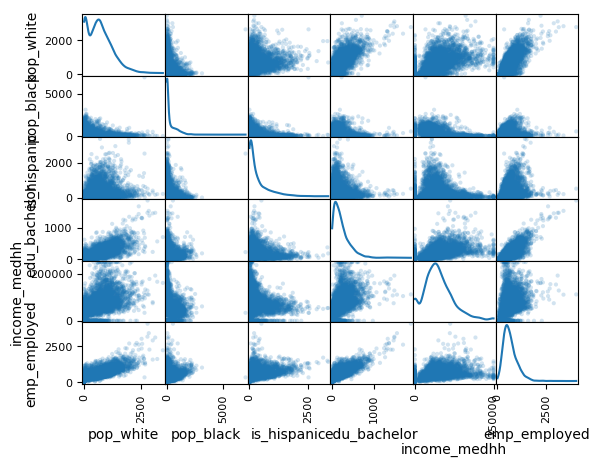

In [17]:
high_level_vars = ["pop_white", "pop_black","is_hispanic", "edu_bachelor", "income_medhh","emp_employed"]
pd.plotting.scatter_matrix(census_df[high_level_vars], diagonal = 'kde', alpha = 0.2)
#plt.rcParams['figure.figsize'] = [20, 12]
plt.show()

Some interesting relationships. Higher absolute numbers of white people have clearly positive relationships with education attainment, income, and employment. This is not true for black populations. But we're dealing in absolute numbers. It probably makes more sense to see percent makeup of block groups rather than absolute counts to take out size component and have clearer view of diversity/variation.

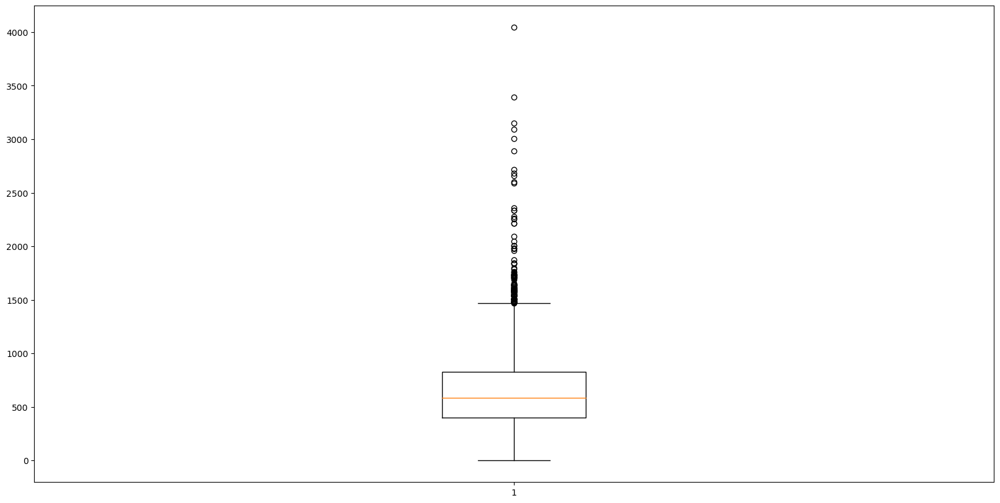

In [18]:
# could check out some boxplots to look for outliers, but this tells us more about the population size of the block group
# than any real info. Need the percents.
fig = plt.figure(figsize =(20, 10))

#ax = fig.add_axes([0, 0, 1, 1])

#plt.boxplot(census_df["income_medhh"])
plt.boxplot(census_df["emp_employed"])
# Creating plot
#bp = ax.boxplot(census_df)
 
# show plot
plt.show()

Create some new variables that will take away the influence of pop size of the block group

In [19]:
census_df.columns

Index(['GISJOIN', 'STUSAB', 'COUNTY', 'TRACTA', 'BLKGRPA', 'GEO_ID',
       'pop_total', 'pop_white', 'pop_black', 'hisp_total', 'is_hispanic',
       'pop_asian', 'pop_native', 'pop_other', 'pop_mixed', 'edu_total',
       'edu_hsgrad', 'edu_bachelor', 'edu_>bachelor', 'income_medhh',
       'emp_total', 'emp_inLF', 'emp_employed', 'emp_unemployed', 'emp_army'],
      dtype='object')

In [20]:
def to_perc_fun(df, total, group, new_var_name):
    """group is the group column name,
       new_var_name is name of new column after calc"""
    df[new_var_name] = df[group]/df[total]



In [21]:
to_perc_fun(census_df, "pop_total", "pop_white", "perc_white")
to_perc_fun(census_df, "pop_total", "pop_black", "perc_black")
to_perc_fun(census_df, "pop_total", "is_hispanic", "perc_hispanic")
to_perc_fun(census_df, "pop_total", "pop_asian", "perc_asian")
to_perc_fun(census_df, "pop_total", "pop_native", "perc_native")
to_perc_fun(census_df, "pop_total", "pop_other", "perc_other")
to_perc_fun(census_df, "pop_total", "pop_mixed", "perc_mixed")
to_perc_fun(census_df, "edu_total", "edu_hsgrad", "perc_hsgrad")
to_perc_fun(census_df, "edu_total", "edu_bachelor", "perc_bachelor")
to_perc_fun(census_df, "edu_total", "edu_>bachelor", "perc_>bachelor")
to_perc_fun(census_df, "emp_total", "emp_inLF", "perc_inLaborForce")
to_perc_fun(census_df, "emp_total", "emp_employed", "perc_employed")
to_perc_fun(census_df, "emp_total", "emp_unemployed", "perc_unemployed")
to_perc_fun(census_df, "emp_total", "emp_army", "perc_army")



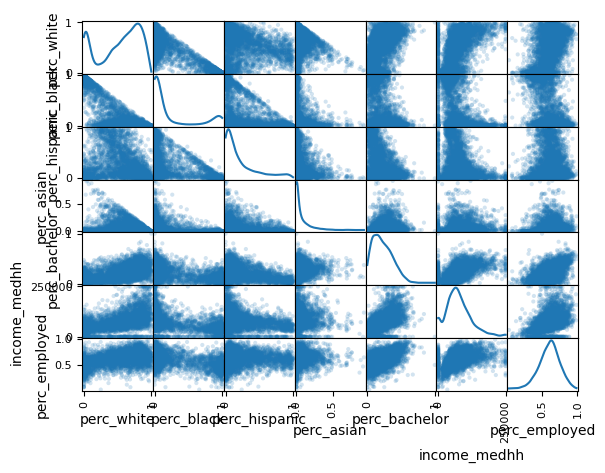

In [22]:
high_level_vars = ["perc_white", "perc_black","perc_hispanic","perc_asian", "perc_bachelor", "income_medhh","perc_employed"]
pd.plotting.scatter_matrix(census_df[high_level_vars], diagonal = 'kde', alpha = 0.2)
#plt.rcParams['figure.figsize'] = [20, 12]
plt.show()

In [23]:
corr = census_df[high_level_vars].corr()
corr.style.background_gradient(cmap='RdYlGn')

,perc_white,perc_black,perc_hispanic,perc_asian,perc_bachelor,income_medhh,perc_employed
perc_white,1.000000,-0.828580,-0.025973,0.085457,0.526121,0.537269,0.429770
perc_black,-0.828580,1.000000,-0.378814,-0.315329,-0.389667,-0.434025,-0.461851
perc_hispanic,-0.025973,-0.378814,1.000000,-0.161470,-0.368690,-0.197985,0.070412
perc_asian,0.085457,-0.315329,-0.161470,1.000000,0.291714,0.151749,0.138246
perc_bachelor,0.526121,-0.389667,-0.368690,0.291714,1.000000,0.543910,0.491525
income_medhh,0.537269,-0.434025,-0.197985,0.151749,0.543910,1.000000,0.419702
perc_employed,0.429770,-0.461851,0.070412,0.138246,0.491525,0.419702,1.000000


<AxesSubplot:>

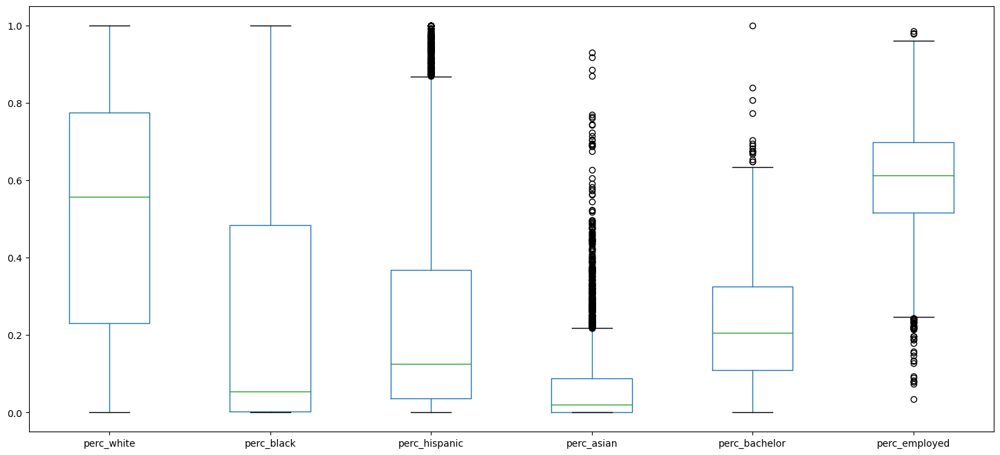

In [24]:
# Looking at the distribution of our demographic percents across block groups
# Note that this is plotting using pandas
# seems like using seaborn would be a good way to go if had long data, 
# ie race was a column, and some numeric value was another column and wanted to see the distro; https://www.geeksforgeeks.org/box-plot-visualization-with-pandas-and-seaborn/
# I think this long form is also necessary for matplotlib...passing essentially a label column and a value column
census_df[["perc_white", "perc_black","perc_hispanic",
           "perc_asian", "perc_bachelor", "perc_employed"]].boxplot(figsize=[18,8], grid= False)




Boxplot above tells us that about half of block groups have a white population <=55%, where about half have a black population <10%.
Also tells that 75% of block groups have an employed rate of ~75% or lower

<AxesSubplot:>

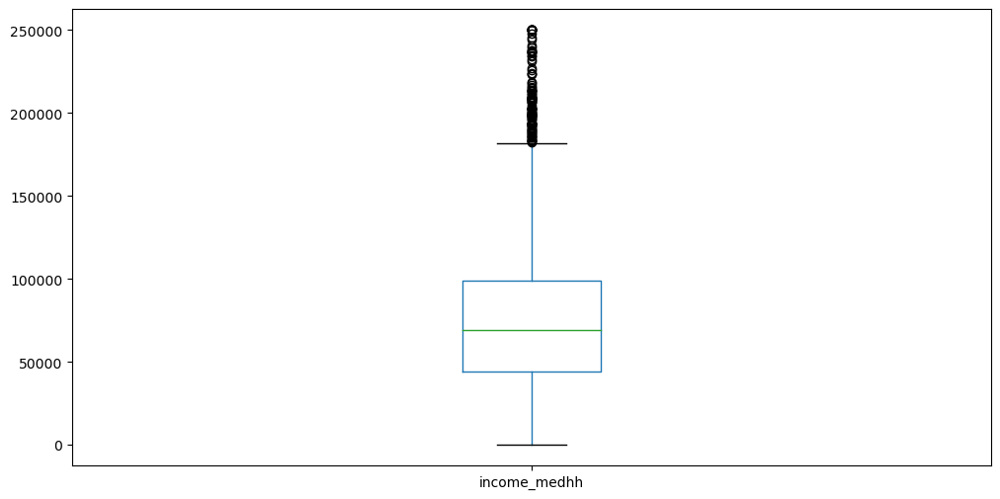

In [25]:
census_df[["income_medhh"]].boxplot(figsize=[12,6], grid=False)
# this is saying that around half of block groups have median hh income at or below about $75K

In [26]:
round(census_df["income_medhh"].mean())

75151

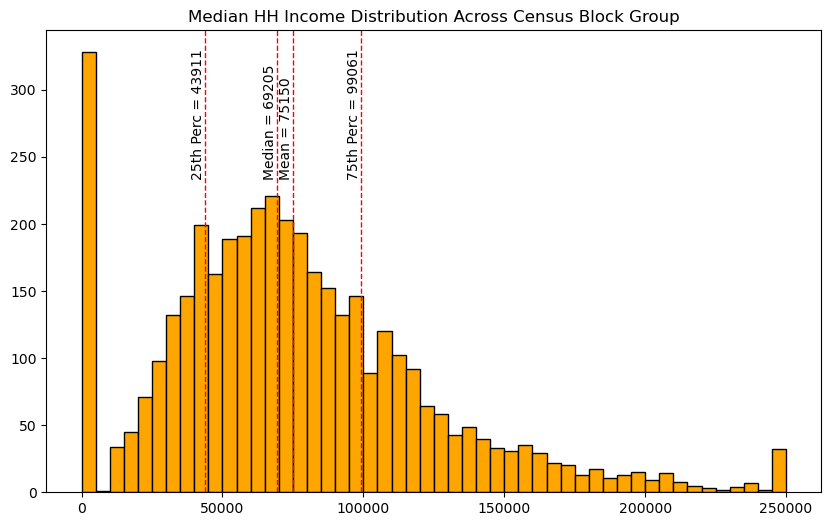

In [27]:
inc_quants = np.quantile(census_df[["income_medhh"]], [0.25,.5,.75,1])

plt.figure(figsize=[10,6])
plt.hist(census_df["income_medhh"], bins = round(census_df["income_medhh"].max()/5000), 
         color="orange", edgecolor='black')

plt.axvline(inc_quants[1], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_quants[1]-5000, 235, 'Median = '+str(int(inc_quants[1]) ), rotation=90)

plt.axvline(inc_quants[0], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_quants[0]-5000, 235, '25th Perc = '+str(int(inc_quants[0]) ), rotation=90)

plt.axvline(census_df["income_medhh"].mean(), color='r', linestyle='dashed', linewidth=1)
plt.text(census_df["income_medhh"].mean()-5000, 235, 'Mean = '+str(int(census_df["income_medhh"].mean()) ), rotation=90)

plt.axvline(inc_quants[2], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_quants[2]-5000, 235, '75th Perc = '+str(int(inc_quants[2]) ), rotation=90)

plt.title("Median HH Income Distribution Across Census Block Group")
plt.show()

In [28]:
inc_quants = np.quantile(census_df[["income_medhh"]], [0,0.25,.5,.75,1])

In [29]:
np.quantile(census_df[census_df["income_medhh"] <=5000]["income_medhh"], [0,0.25,.5,.75,1])
# About 75% of that first bar spike has value $0, so this tells me this is largely missing data

array([   0.,    0.,    0.,    0., 2499.])

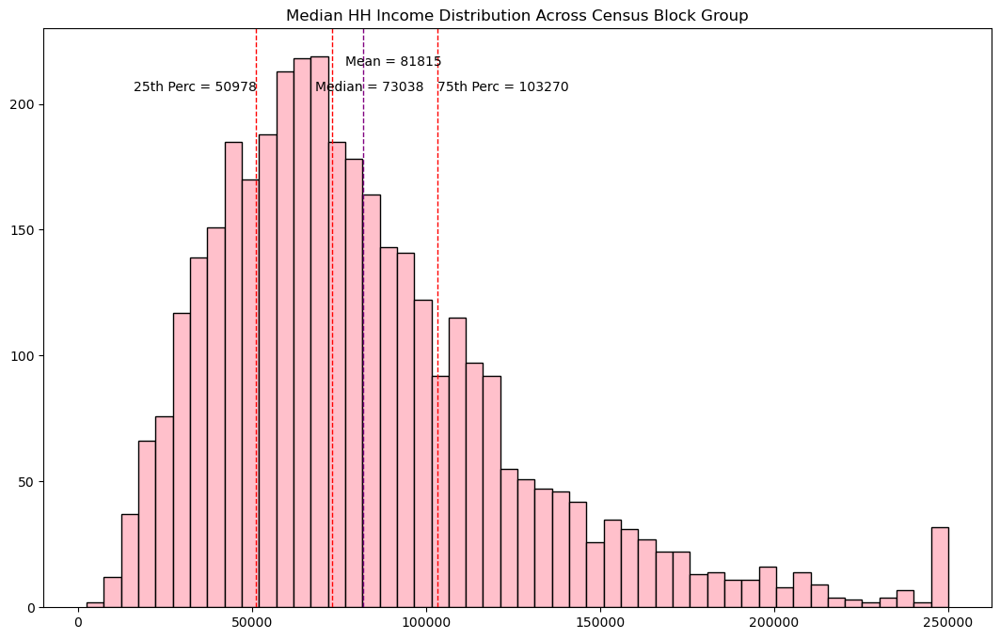

In [30]:
# Removing rows who had income of 0 and replotting

sin0 = census_df[census_df["income_medhh"] != 0]

inc_qnts = np.quantile(sin0[["income_medhh"]], [0.25,.5,.75,1])

plt.figure(figsize=[13,8])
plt.hist(sin0["income_medhh"], bins = round(sin0["income_medhh"].max()/5000), 
         color="pink", edgecolor='black')

plt.axvline(inc_qnts[1], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_qnts[1]-5000, 205, 'Median = '+str(int(inc_qnts[1]) ))

plt.axvline(inc_qnts[0], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_qnts[0]-35000, 205, '25th Perc = '+str(int(inc_qnts[0]) ))

plt.axvline(sin0["income_medhh"].mean(), color='purple', linestyle='dashed', linewidth=1)
plt.text(sin0["income_medhh"].mean()-5000, 215, 'Mean = '+str(int(sin0["income_medhh"].mean()) ))

plt.axvline(inc_qnts[2], color='r', linestyle='dashed', linewidth=1)
plt.text(inc_qnts[2], 205, '75th Perc = '+str(int(inc_qnts[2]) ))

plt.title("Median HH Income Distribution Across Census Block Group")
plt.show()

In [31]:
#paired down vars
census = census_df[['GISJOIN','TRACTA', 'BLKGRPA', 'GEO_ID', 'pop_total', 'emp_total', 
                    'perc_white', 'perc_black', 'perc_hispanic', 'perc_asian','perc_native', 'perc_other', 'perc_mixed',
                    'perc_hsgrad','perc_bachelor', 'perc_>bachelor',
                    'income_medhh',
                    'perc_inLaborForce', 'perc_employed','perc_unemployed'
                   ]]

## Spinning up a Quick Map

In [32]:
# shape file for Chi community areas
cmnty_sf = gpd.read_file("/Users/laurenshores/Documents/Data_Science_Projects/Exploring_Chicago_Neighborhoods/Data/Boundaries_Community_Areas/geo_export_782a78c7-402d-4a93-bb37-c4ab05c3b15b.shp")



/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


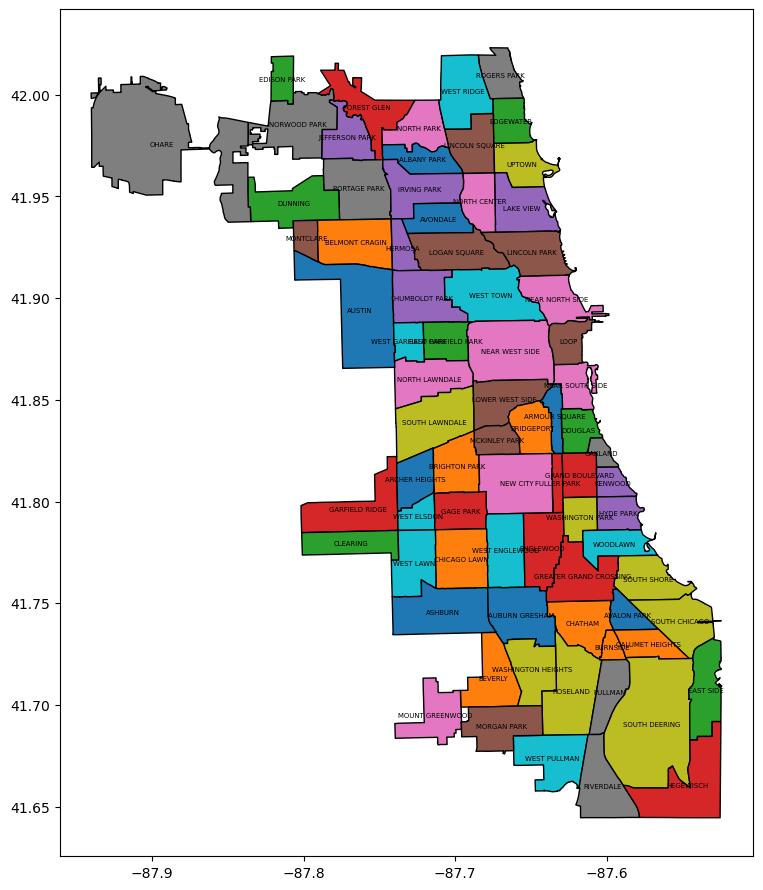

In [33]:
ax = cmnty_sf.plot(column='community', figsize=[18,11], edgecolor='black')

for x, y, label in zip(cmnty_sf.geometry.centroid.x, cmnty_sf.geometry.centroid.y, cmnty_sf['community']):
    ax.text(x, y, label, fontsize=5, ha='center', va='center')

In [34]:
len(cmnty_sf)

77

In [35]:
blkGrp_sf = gpd.read_file("/Users/laurenshores/Documents/Data_Science_Projects/Exploring_Chicago_Neighborhoods/Data/tigerLine_2019_IL_bg/tl_2019_17_bg.shp") 
                          #filter(COUNTYFP == '031', STATEFP == '17')
                          
# cook county is countypf 31
#blkGrp_sf = blkGrp_sf[blkGrp_sf["COUNTYFP"] == "31"].reset_index()

                       

In [36]:
blkGrp_sf = blkGrp_sf[(blkGrp_sf["COUNTYFP"] == "031")]

"""This shapefile contains a bunch of water in lake michigan that makes the plot awkward. 
 filter out the the largest water area """
max_water_area = blkGrp_sf["AWATER"].max()
blkGrp_sf = blkGrp_sf[blkGrp_sf["AWATER"]!= max_water_area]




<AxesSubplot:>

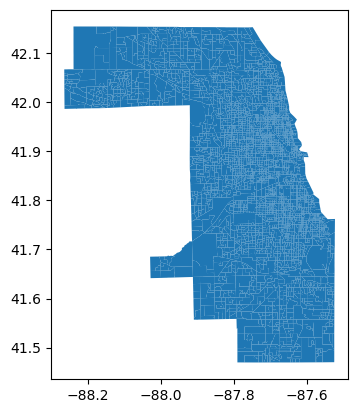

In [37]:
blkGrp_sf.plot()

In [38]:
blkGrp_sf.head(3)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
4,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,+41.8626758,-087.7629100,"POLYGON ((-87.76799 41.86555, -87.76774 41.865..."
25,17,031,820502,2,170318205022,Block Group 2,G5030,S,455769,0,+41.7518678,-087.8045848,"POLYGON ((-87.80959 41.75345, -87.80942 41.753..."
26,17,031,672000,3,170316720003,Block Group 3,G5030,S,184727,0,+41.7620710,-087.6728544,"POLYGON ((-87.67475 41.76480, -87.67450 41.764..."


In [39]:
# Use a spatial join to add community area info to blockgroup data
"""Here I use within because intersect causes duplicates for block group (probably because some block group boundaries
touch/fall within the boundary of more than one community area). For our purposes, I'd rather have missing community
than have duplicated block groups just to show that it touches to more than one community area

Or, I could do an intersect and just drop duplicates, keeping the first row. This had less missing communities,
without duplicated blockgroups than using the 'within'  method

https://stackoverflow.com/questions/68504942/how-do-geopandas-sjoin-predicate-within-and-intersects-differ

"""

z =gpd.sjoin(blkGrp_sf, cmnty_sf[["community","geometry"]], how="left")
z = z.drop_duplicates(subset= ['STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'GEOID', 'NAMELSAD',
       'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
       'geometry'], keep="first")
print(len(z[z["community"].isna()]))
print(z.head(2))

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4269
Right CRS: EPSG:4326

  del sys.path[0]


1660
   STATEFP COUNTYFP TRACTCE BLKGRPCE         GEOID       NAMELSAD  MTFCC  \
4       17      031  813400        1  170318134001  Block Group 1  G5030   
25      17      031  820502        2  170318205022  Block Group 2  G5030   

   FUNCSTAT   ALAND  AWATER     INTPTLAT      INTPTLON  \
4         S  415954       0  +41.8626758  -087.7629100   
25        S  455769       0  +41.7518678  -087.8045848   

                                             geometry  index_right community  
4   POLYGON ((-87.76799 41.86555, -87.76774 41.865...         25.0    AUSTIN  
25  POLYGON ((-87.80959 41.75345, -87.80942 41.753...          NaN       NaN  


In [40]:
print(len(z))
print(len(blkGrp_sf))

3992
3992


In [41]:
# Join blkgrp + community data with census data
df = pd.merge(z, census, how="left", left_on=["TRACTCE", "BLKGRPCE"],
         right_on = ["TRACTA", "BLKGRPA"]
        )

df.drop(columns =["index_right"], inplace=True)

In [42]:
print(len(df[df['community'].isna()]))

df['community'] =  df['community'].fillna('Unknown').astype('str')
df['comm_test'] = np.where(df['community'] == "Unknown","Unknown","Other")

1660


<AxesSubplot:>

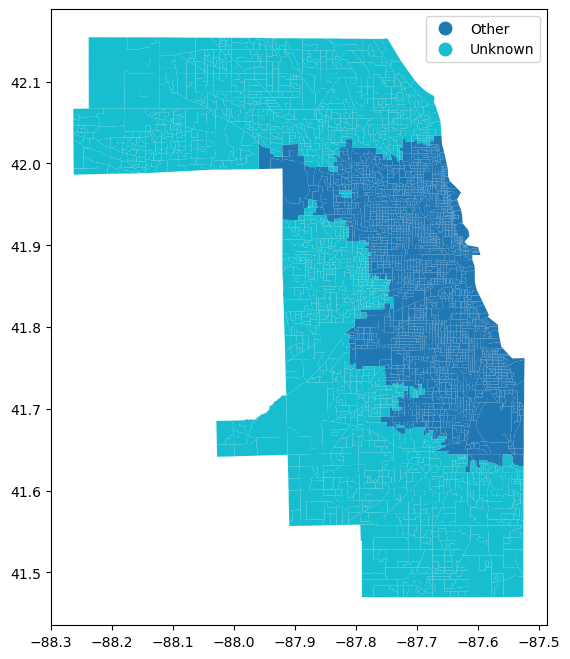

In [43]:
# just taking a look at datasets. blkgrp data is cook county and community data is Chicago. Thus the difference

df.plot(column='comm_test' , figsize=[12,8], legend=True, categorical=True)

#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.tight_layout()
# column="income_medhh",  cmap='OrRd', missing_kwds={'color': 'lightgrey'}

In [44]:
print(len(df))
print(len(census))
print(len(blkGrp_sf))

3992
4002
3992


In [45]:
#Checking the projections
df["geometry"].crs 

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - NAD83
- bounds: (167.65, 14.92, -47.74, 86.46)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [46]:
# Create a feature for population density
df["pop_density"] = df["pop_total"]/ df["ALAND"]

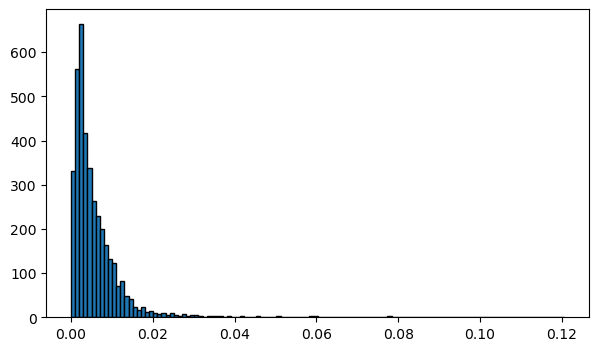

In [47]:
plt.figure(figsize=[7,4])
plt.hist(df["pop_density"], bins= int(df["pop_density"].max()/.001), edgecolor="black")
plt.show()


In [48]:
# Want to break block group income into percentile groups for a cleaner plot.
# using sin0 because this dataset removes block groups with 0 income

#np.quantile(census_df[[""income_medhh""]], [0.25,.5,.75,1])
inc_perc = np.quantile(sin0[["income_medhh"]],[.1,.2,.3,.4,.5,.6,.7,.8,.9,1])

df["bg_inc_deciles"] = np.where(df["income_medhh"] < inc_perc[0], "Perc_10th",
        np.where(df["income_medhh"] < inc_perc[1], "Perc_20th",
                np.where(df["income_medhh"] < inc_perc[2], "Perc_30th",
                        np.where(df["income_medhh"] < inc_perc[3], "Perc_40th",
                                np.where(df["income_medhh"] < inc_perc[4], "Perc_50th",
                                        np.where(df["income_medhh"] < inc_perc[5], "Perc_60th",
                                                np.where(df["income_medhh"] < inc_perc[6], "Perc_70th",
                                                        np.where(df["income_medhh"] < inc_perc[7], "Perc_80th",
                                                                np.where(df["income_medhh"] < inc_perc[8], "Perc_90th",
                                                                        "Top"
                                                                        )))))))))

Text(0.5, 1.0, 'Median HH Income by Percentiles')

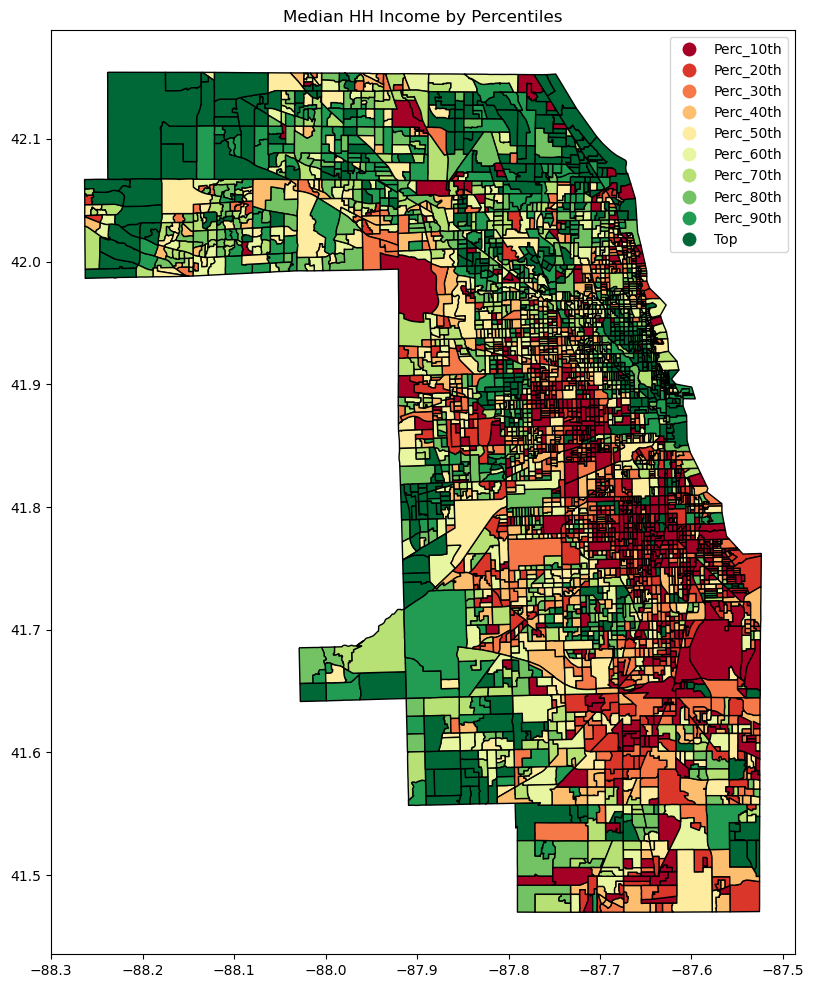

In [49]:
df.plot(column="bg_inc_deciles", figsize=[18,12],cmap="RdYlGn", legend=True, edgecolor='black')
plt.title("Median HH Income by Percentiles")

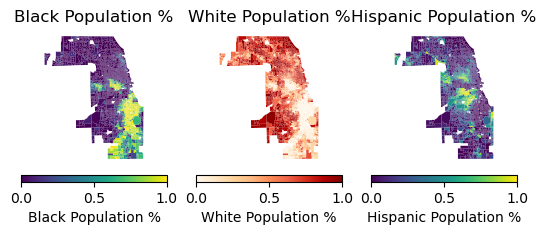

In [50]:
#income, bach, unemployed
# black, white,hispanic, density


fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3)

divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("bottom", size="5%", pad=0.1)
ax1 = df.plot(ax=ax1, column='perc_black', legend=True, cax=cax1,
             legend_kwds ={'label': "Black Population %",'orientation': "horizontal"})
ax1.set_title("Black Population %")
ax1.set_axis_off();

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("bottom", size="5%", pad=0.1)
ax2 = df.plot(ax=ax2, column='perc_white', legend=True, cax=cax2, cmap='OrRd',
             legend_kwds ={'label': "White Population %", 'orientation': "horizontal"})
ax2.set_title("White Population %")
ax2.set_axis_off();

divider3 = make_axes_locatable(ax3)
cax3 = divider3.append_axes("bottom", size="5%", pad=0.1)
ax3 = df.plot(ax=ax3, column='perc_hispanic', legend=True, cax=cax3, 
             legend_kwds ={'label': "Hispanic Population %", 'orientation': "horizontal"})
ax3.set_title("Hispanic Population %")
ax3.set_axis_off();


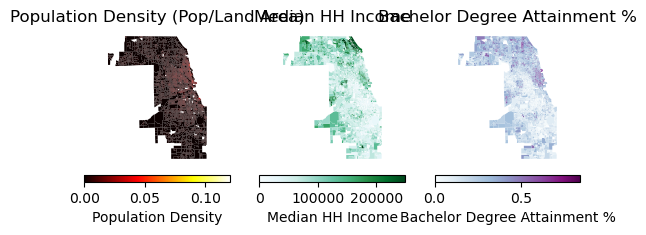

In [51]:
#-----------------
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3)

divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("bottom", size="5%", pad=0.1)
ax1 = df.plot(ax=ax1, column='pop_density', legend=True, cax=cax1, cmap='hot',
             legend_kwds ={'label': "Population Density",'orientation': "horizontal"})
ax1.set_title("Population Density (Pop/Land Area)")
ax1.set_axis_off();

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("bottom", size="5%", pad=0.1)
ax2 = df.plot(ax=ax2, column='income_medhh', legend=True, cax=cax2, cmap='BuGn',
             legend_kwds ={'label': "Median HH Income", 'orientation': "horizontal"})
ax2.set_title("Median HH Income")
ax2.set_axis_off();

divider3 = make_axes_locatable(ax3)
cax3 = divider3.append_axes("bottom", size="5%", pad=0.1)
ax3 = df.plot(ax=ax3, column='perc_bachelor', legend=True, cax=cax3, cmap='BuPu',
             legend_kwds ={'label': "Bachelor Degree Attainment %", 'orientation': "horizontal"})
ax3.set_title("Bachelor Degree Attainment %")
ax3.set_axis_off();
#by community, bar of

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


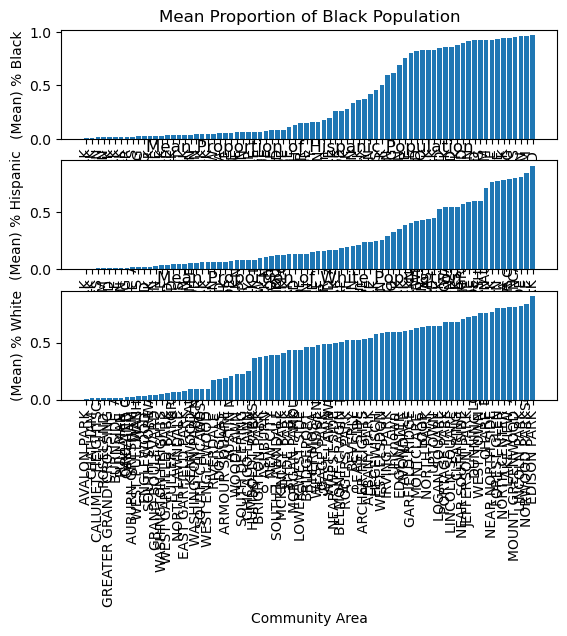

In [52]:
blackByComm = df.groupby("community")["perc_black"].mean().sort_values()
hispanicByComm = df.groupby("community")["perc_hispanic"].mean().sort_values()
whiteByComm = df.groupby("community")["perc_white"].mean().sort_values()


fig, (ax, ax2,ax3) = plt.subplots(3,1, constrained_layout=True)

ax.bar(blackByComm.index, blackByComm)
ax.set_title("Mean Proportion of Black Population")
ax.set_xlabel("Community Area")
ax.set_ylabel("(Mean) % Black")
# Rotating X-axis labels
#ax.set_xticklabels(ax.get_xticks(), rotation = 90)
for tick in ax.get_xticklabels():
    tick.set_rotation(90)

ax2.bar(hispanicByComm.index, hispanicByComm)
ax2.set_title("Mean Proportion of Hispanic Population")
ax2.set_xlabel("Community Area")
ax2.set_ylabel("(Mean) % Hispanic")
#plt.xticks(rotation = 90)
for tick in ax2.get_xticklabels():
    tick.set_rotation(90)

ax3.bar(whiteByComm.index, whiteByComm)
ax3.set_title("Mean Proportion of White Population")
ax3.set_xlabel("Community Area")
ax3.set_ylabel("(Mean) % White")
plt.xticks(rotation = 90)


"""to adjust whitespace between plots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
"""
plt.show()

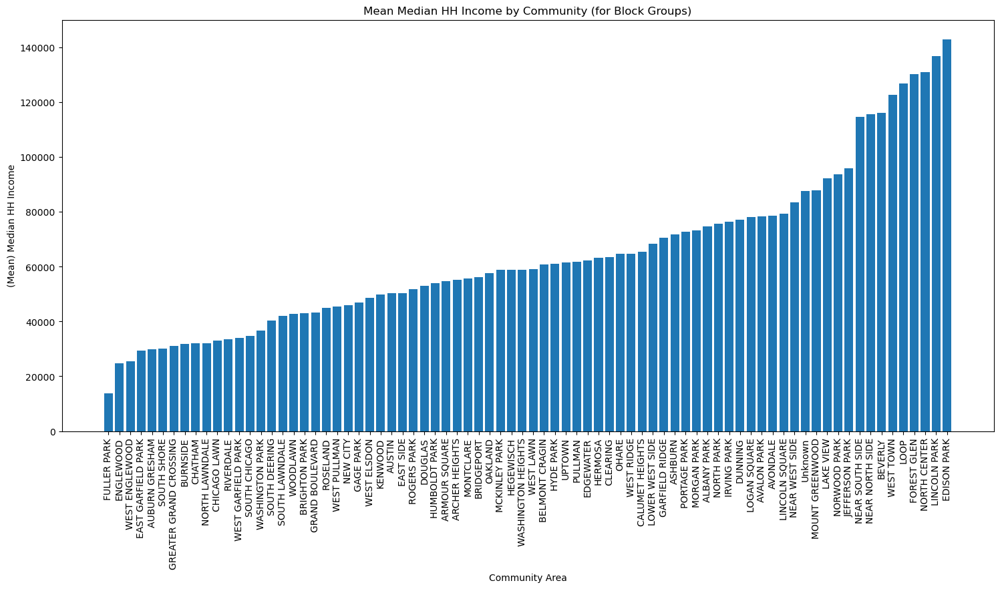

In [53]:
#by community, bar of race
#how affluent
incomeByComm = df.groupby("community")["income_medhh"].mean().sort_values()

fig, ax = plt.subplots(figsize=[18,8])
ax.bar(incomeByComm.index, incomeByComm)
ax.set_title("Mean Median HH Income by Community (for Block Groups)")
ax.set_xlabel("Community Area")
ax.set_ylabel("(Mean) Median HH Income")
plt.xticks(rotation = 90)

plt.show()

3992


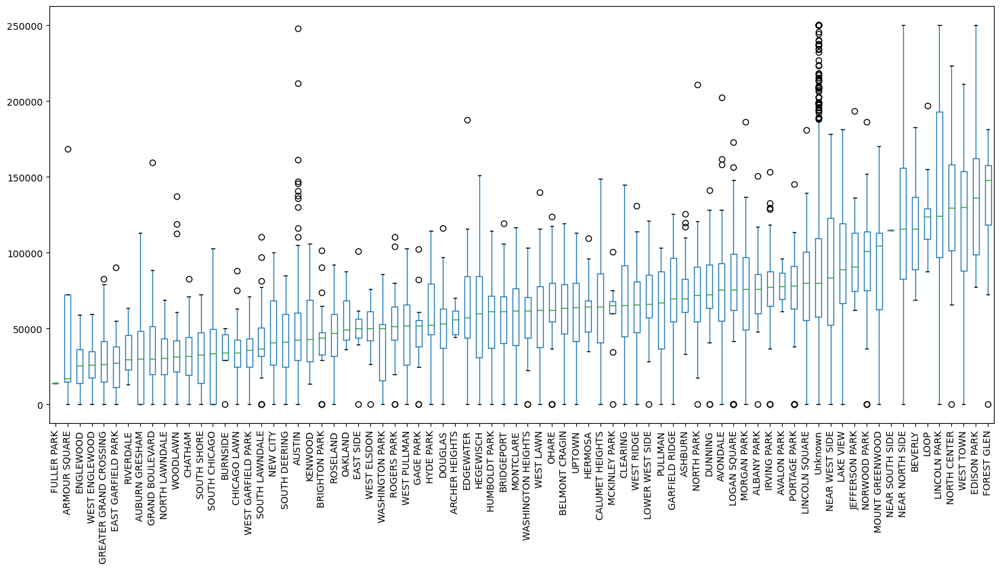

In [54]:
# Want to see the distribution of income across communities per bg. how diverse are communities economically by block?
# make a column where geometry is converted to string, so can pivot/make wide data

df["bg_geometry"] = df["geometry"].astype("str")

#make wide, where each community is a column, each row is a geometry(bg)
v= df.pivot(index="bg_geometry", columns="community", values="income_medhh")
print(len(v))

# use this to sort the boxplot by medians
srt=v.median().sort_values()
v[srt.index].boxplot(figsize=[18,8], grid= False)

plt.xticks(rotation = 90)
plt.show()

### What other analysis might be interesting here? Keep the main objective in focus.
* Eventually estimating rental prices based on these data
* Making an interactive tool that will help me decide what areas to live in

# <font color='green'>Adding in More Data (By Spatial Joins)</font>

In [55]:
"""
cta_df 
crime_df 
biz_df 
rental_df 
"""

'\ncta_df \ncrime_df \nbiz_df \nrental_df \n'

In [56]:
#cta_df # would need to "join" by seeing which polygons the lat/long falls into
#crime_df # same for joining here as well. This data has some time series potential
#biz_df # would need same join method with polygons lat longs. some of these need to convert address to lat/long.
#may have some ts potential as well with date issued

#rental_df # same for lat/longs. 

#Adding rentals will blow out the block group level stats because will repeat. 
#Actually adding any of these will blow out the stats and will
#have to take an avg if want to visualize

In [57]:
df.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'GEOID', 'NAMELSAD',
       'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
       'geometry', 'community', 'GISJOIN', 'TRACTA', 'BLKGRPA', 'GEO_ID',
       'pop_total', 'emp_total', 'perc_white', 'perc_black', 'perc_hispanic',
       'perc_asian', 'perc_native', 'perc_other', 'perc_mixed', 'perc_hsgrad',
       'perc_bachelor', 'perc_>bachelor', 'income_medhh', 'perc_inLaborForce',
       'perc_employed', 'perc_unemployed', 'comm_test', 'pop_density',
       'bg_inc_deciles', 'bg_geometry'],
      dtype='object')

Coordinate Reference System (crs) gives context to how our points/coordinates should be interpreted/related to places on earth, rather than what they start off as, which is geometric shapes in arbitrary space. 
Most commonly used CRS is the WGS84 latitude-longitude projection (authority code "EPSG:4326").

new_df = gpd.sjoin(A,B,how="inner", op='intersects')

Make sure they're using the same projection reference

pointdf.crs = polydf.crs

#Checking the projections

df["geometry"].crs 


## <font color='red'>Crime</font>

* Date from object to DateType. Month/Year
* to geo_pandas
* lat/long to geometry


In [58]:
crime_df = pd.read_csv(data_path + "Crimes_-_2020.csv")


In [59]:
print(len(crime_df["Location Description"].drop_duplicates()))
print(len(crime_df["Description"].drop_duplicates()))
print(len(crime_df["Primary Type"].drop_duplicates()))

166
419
33


In [60]:
crime_df.dtypes

ID                        int64
Case Number              object
Date                     object
Block                    object
IUCR                     object
Primary Type             object
Description              object
Location Description     object
Arrest                     bool
Domestic                   bool
Beat                      int64
District                  int64
Ward                    float64
Community Area          float64
FBI Code                 object
X Coordinate            float64
Y Coordinate            float64
Year                      int64
Updated On               object
Latitude                float64
Longitude               float64
Location                 object
dtype: object

In [61]:
crime_df["Date"] = pd.to_datetime(crime_df["Date"])
crime_df["YearMonth"] = crime_df["Date"].dt.to_period('M')

In [62]:
crime = crime_df[["Case Number", "Date", "YearMonth", "Primary Type","Description", 
                  "Location Description", "Arrest", "Domestic", "Latitude", "Longitude"]]


In [63]:
crimeYM = pd.DataFrame(crime.groupby(["YearMonth", "Primary Type"])["Case Number"].count())
crimeYM.reset_index(inplace=True)

In [64]:
crimeType = pd.DataFrame(crimeYM.groupby(["Primary Type"])["Case Number"].sum())#.reset_index(inplace=True)

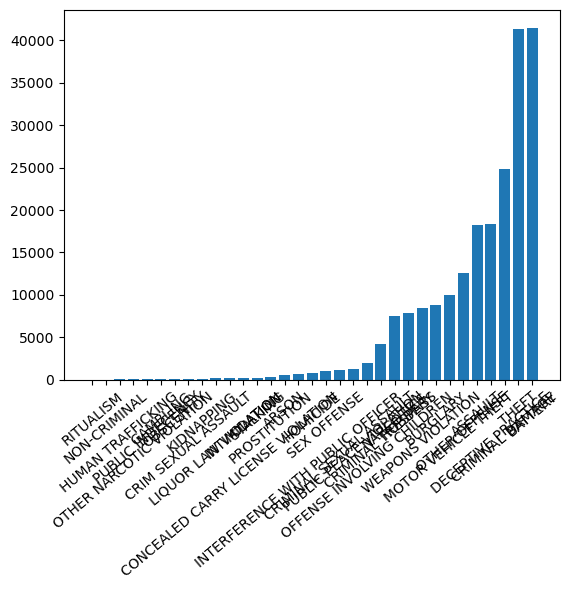

In [65]:
#crimeYM
crimeType.sort_values('Case Number',inplace=True)
plt.bar(crimeType.index, crimeType["Case Number"])
# Rotating X-axis labels
plt.xticks(rotation = 40)
plt.show()

In [66]:
#crimeYM
# pivot the data into the correct shape. Data Needs to be wide where each crime type is a column
# in order to be able to plot each type as it's own line on the graph
crimeYM_wide = crimeYM.pivot(index='YearMonth', columns='Primary Type', values='Case Number')

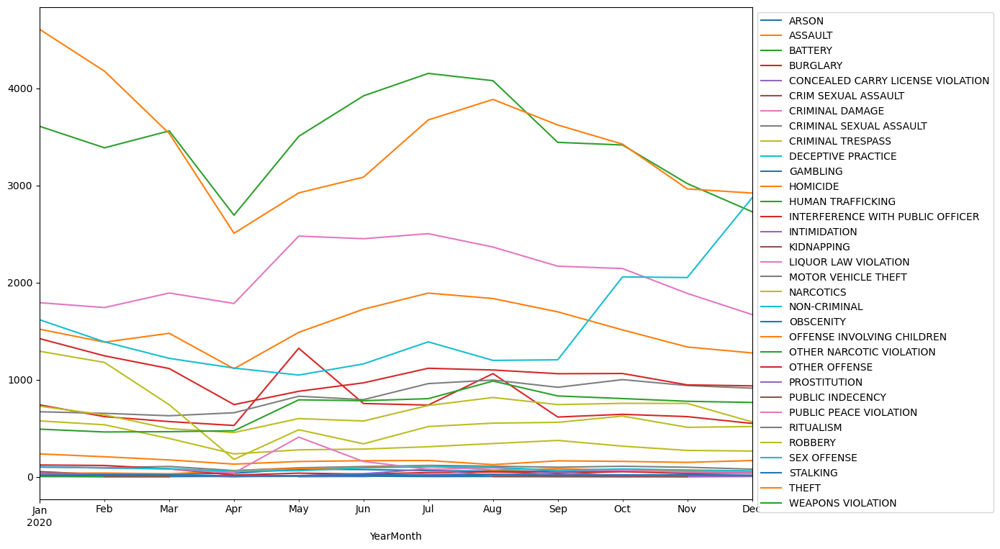

In [67]:
crimeYM_wide.plot( figsize=(14, 8))
# get the legend outside of the plot
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()

Create my own crime catagories to have more succinct analysis when data is joined

In [68]:
crime["crime_cat"] = np.where(crime["Primary Type"].isin(["ASSAULT", "BATTERY"]), "Violent Crime",
                             np.where(crime["Primary Type"].isin(["CRIM SEXUAL ASSAULT", "CRIMINAL SEXUAL ASSAULT"]), "Sexual Assault",
                                     np.where(crime["Primary Type"].isin(["MOTOR VEHICLE THEFT", "ROBBERY", "THEFT"]), "Theft",
                                             np.where(crime["Primary Type"] == "HOMICIDE", "Homicide",
                                                     np.where(crime["Primary Type"].isin(["NARCOTICS", "OTHER NARCOTIC VIOLATION"]),"Narcotics",
                                                             "Other")))))



/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [69]:
len(crime)

212224

In [70]:
# Make a crime geopandas frame and convert lat long to geometry
gdf_crime = gpd.GeoDataFrame(
    crime[["Case Number", "YearMonth","crime_cat","Arrest","Latitude", "Longitude"]], 
    geometry=gpd.points_from_xy( crime["Longitude"], crime["Latitude"])#, crs="EPSG:4269"
)

gdf_crime.drop(columns=["Longitude", "Latitude"], inplace=True)
#https://geopandas.org/en/latest/gallery/create_geopandas_from_pandas.html

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


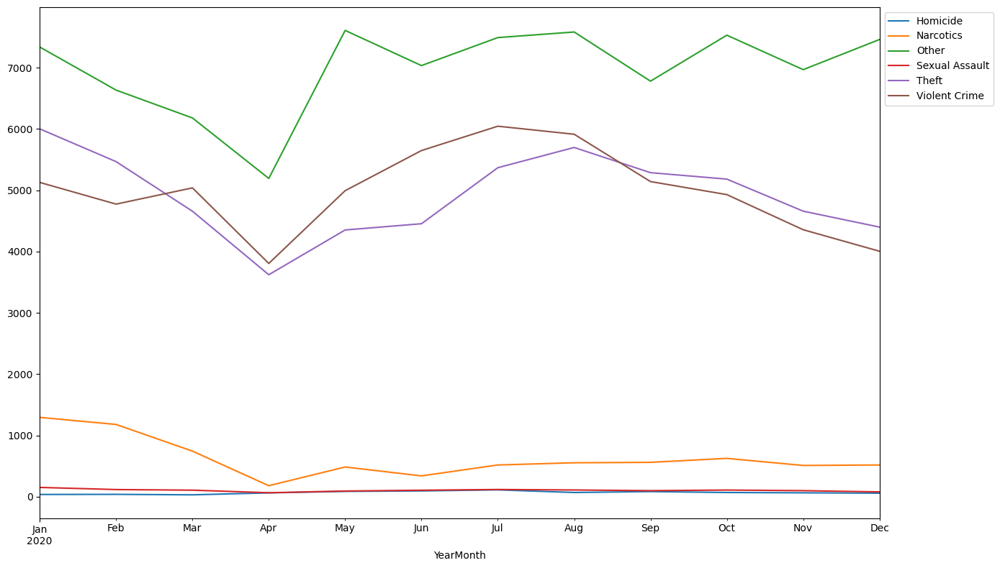

In [71]:
crime_wide = pd.DataFrame(gdf_crime.groupby(["YearMonth", "crime_cat"])["Case Number"].count()).\
rename(columns={"Case Number": "crime_count"}).\
reset_index().pivot(index="YearMonth", columns="crime_cat", values="crime_count")

crime_wide.plot( figsize=(14, 8))
# get the legend outside of the plot
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.tight_layout()

In [72]:
# at this point df is our census block groups, with community areas and census data added for the block groups
len(df)

3992

In [73]:
# what we want is to be able to allocate each crime (point) to a block group on a join

In [74]:
gdf_crime

,Case Number,YearMonth,crime_cat,Arrest,geometry
0,JD226426,2020-05,Theft,False,POINT (-87.62175 41.83048)
1,JD209965,2020-04,Violent Crime,True,POINT (-87.63962 41.83631)
2,JD282112,2020-07,Violent Crime,True,POINT (-87.54918 41.74761)
3,JD381597,2020-09,Violent Crime,False,POINT (-87.67137 41.77488)
4,JD321064,2020-08,Other,True,POINT (-87.65848 41.74622)
...,...,...,...,...,...
212219,JD327752,2020-08,Other,False,POINT (-87.69810 41.77267)
212220,JD269218,2020-06,Theft,False,POINT (-87.61421 41.72455)
212221,JD311791,2020-07,Violent Crime,False,POINT (-87.70946 41.87092)
212222,JD340297,2020-08,Theft,False,POINT (-87.68893 41.99593)


In [75]:
# to preserve the crime points geometry after the join
gdf_crime["crime_geo"] = gdf_crime["geometry"].astype("str")

In [76]:
gdf_crime.dtypes

Case Number       object
YearMonth      period[M]
crime_cat         object
Arrest              bool
geometry        geometry
crime_geo         object
dtype: object

In [77]:
# Make sure they're using the same projection reference
df.crs = gdf_crime.crs

df1 =gpd.sjoin(df, gdf_crime,  how="left", op="intersects").reset_index(drop=True)

df1.drop(columns=["index_right"], inplace=True)

In [78]:
df1.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,perc_unemployed,comm_test,pop_density,bg_inc_deciles,bg_geometry,Case Number,YearMonth,crime_cat,Arrest,crime_geo
0,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD292547,2020-07,Other,False,POINT (-87.765856246 41.865573795)
1,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD137726,2020-02,Theft,False,POINT (-87.765856246 41.865573795)
2,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD342506,2020-08,Violent Crime,False,POINT (-87.765856246 41.865573795)
3,17,031,820502,2,170318205022,Block Group 2,G5030,S,455769,0,...,0.033939,Unknown,0.002067,Perc_10th,"POLYGON ((-87.80959299999999 41.753446, -87.80...",NaN,NaT,NaN,NaN,NaN
4,17,031,672000,3,170316720003,Block Group 3,G5030,S,184727,0,...,0.198324,Other,0.002127,Perc_10th,"POLYGON ((-87.674745 41.764799, -87.6745019999...",JD210831,2020-04,Other,False,POINT (-87.67383535499999 41.764803632)


209666


<AxesSubplot:>

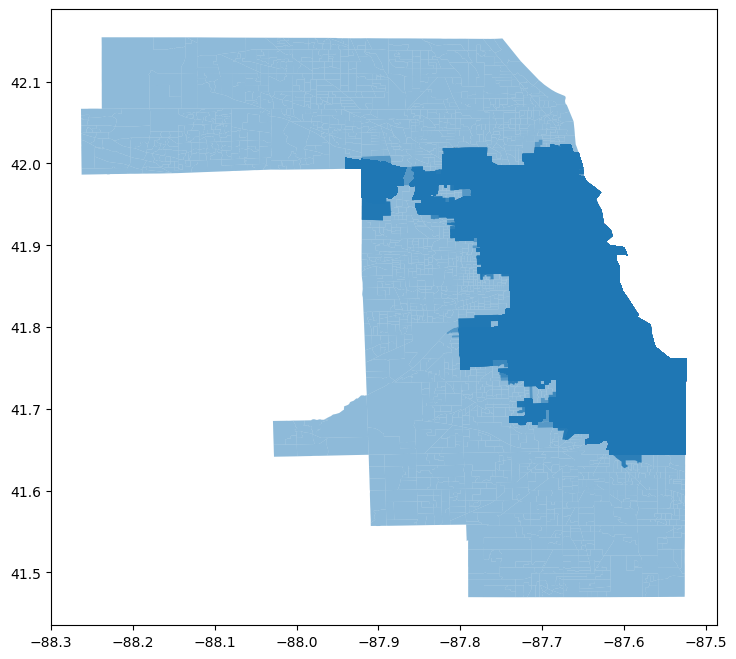

In [79]:
print(len(df1))

df1.plot(alpha=0.5, figsize=[15,8])

# I think this happens because after we make the sjoin with crime, our polygon geometry will have duplicates because
# more than one crime point will appear in a bg/geometry. so a duplicate will need to be created to accomodate.
#maybe the next step is to group by the polygon and get crime counts, or crime wide

In [80]:
df1["geometry"].head(3)

0    POLYGON ((-87.76799 41.86555, -87.76774 41.865...
1    POLYGON ((-87.76799 41.86555, -87.76774 41.865...
2    POLYGON ((-87.76799 41.86555, -87.76774 41.865...
Name: geometry, dtype: geometry

In [81]:
df1.dtypes

STATEFP                 object
COUNTYFP                object
TRACTCE                 object
BLKGRPCE                object
GEOID                   object
NAMELSAD                object
MTFCC                   object
FUNCSTAT                object
ALAND                    int64
AWATER                   int64
INTPTLAT                object
INTPTLON                object
geometry              geometry
community               object
GISJOIN                 object
TRACTA                  object
BLKGRPA                 object
GEO_ID                  object
pop_total              float64
emp_total              float64
perc_white             float64
perc_black             float64
perc_hispanic          float64
perc_asian             float64
perc_native            float64
perc_other             float64
perc_mixed             float64
perc_hsgrad            float64
perc_bachelor          float64
perc_>bachelor         float64
income_medhh           float64
perc_inLaborForce      float64
perc_emp

In [82]:
print(len(df1))
print(len(df1[df1["crime_cat"].isna()]))
df1.head(3)

209666
1719


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,perc_unemployed,comm_test,pop_density,bg_inc_deciles,bg_geometry,Case Number,YearMonth,crime_cat,Arrest,crime_geo
0,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD292547,2020-07,Other,False,POINT (-87.765856246 41.865573795)
1,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD137726,2020-02,Theft,False,POINT (-87.765856246 41.865573795)
2,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.019553,Other,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,JD342506,2020-08,Violent Crime,False,POINT (-87.765856246 41.865573795)


<AxesSubplot:>

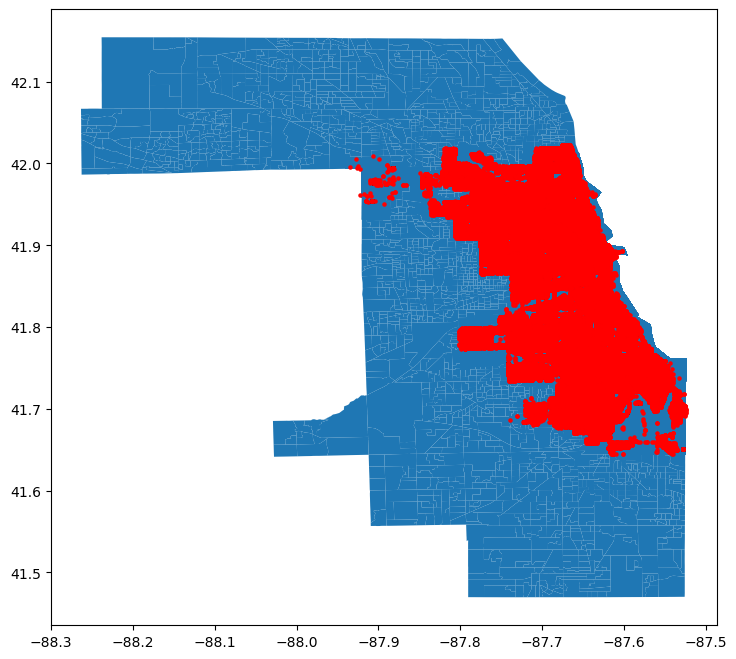

In [83]:
f, ax = plt.subplots(figsize=[12,8])
df1["geometry"].plot(ax=ax)
gdf_crime.plot(ax=ax, color='red', markersize=5)

Next Steps:
* businesses and homes still need to be added to the dataset (last thing on the list)
* do some geo analysis about crime
    * Which communities have higher crime and of what type?
    * Which communities have higher arrest rates? Does this differ by crime type?
    * are there synergies between crime and the demographic data
* can we make some maps exhibing demographic distribution in the city? (can probably do this in the section before crime)
* take some time to dig deeper in plotting with matplotlib...these plots could look a lot better.
* document the journey through blog posts...think about how will break out what I've done so far?
    * Forming a goal/problem
    * Finding a dataset
    * Pulling together different datasets
    * Exploratory analysis
    * Geopandas and spatial analysis
    * virtual environments
    * haven't done this yet, but thinking about the efficacy of your data. Want to write something about how nghis compiles their data, the assumptions they make, and the statistical ranges they employ (b/c the census data wasn't actually collected).
    

In [84]:


#could make a df where crime counts for each cat is a column and join in back on the original frame.
#the issue is that we want to count these crimes at the block group level, so I don't see a way around grouping by geometry
#df1["geometry"].to_wkt()
"""
out = pts.groupby(['id', pts['geometry'].to_wkt()]).agg(prom_revenue=('prix', np.mean)).reset_index()
out.columns = ['id', 'geometry', 'pro_revenue']
out['geometry'] = gp.GeoSeries.from_wkt(out['geometry'])
out = gp.GeoDataFrame(out)
print(out)"""

"\nout = pts.groupby(['id', pts['geometry'].to_wkt()]).agg(prom_revenue=('prix', np.mean)).reset_index()\nout.columns = ['id', 'geometry', 'pro_revenue']\nout['geometry'] = gp.GeoSeries.from_wkt(out['geometry'])\nout = gp.GeoDataFrame(out)\nprint(out)"

In [85]:
# get crime counts by block group

k = pd.DataFrame(df1.groupby([df1["geometry"].astype("str"),"community","crime_cat"])["Case Number"].count())
k.reset_index().rename(columns={"Case Number":"crime_counts"})

# also add arrest counts by block group

,geometry,community,crime_cat,crime_counts
0,"POLYGON ((-87.53165799999999 41.702716, -87.53...",EAST SIDE,Narcotics,2
1,"POLYGON ((-87.53165799999999 41.702716, -87.53...",EAST SIDE,Other,14
2,"POLYGON ((-87.53165799999999 41.702716, -87.53...",EAST SIDE,Theft,7
3,"POLYGON ((-87.53165799999999 41.702716, -87.53...",EAST SIDE,Violent Crime,17
4,"POLYGON ((-87.531661 41.708219, -87.5314789999...",EAST SIDE,Other,15
...,...,...,...,...
9313,"POLYGON ((-87.940247 42.007172, -87.940173 42....",OHARE,Narcotics,88
9314,"POLYGON ((-87.940247 42.007172, -87.940173 42....",OHARE,Other,207
9315,"POLYGON ((-87.940247 42.007172, -87.940173 42....",OHARE,Theft,185
9316,"POLYGON ((-87.940247 42.007172, -87.940173 42....",OHARE,Violent Crime,104


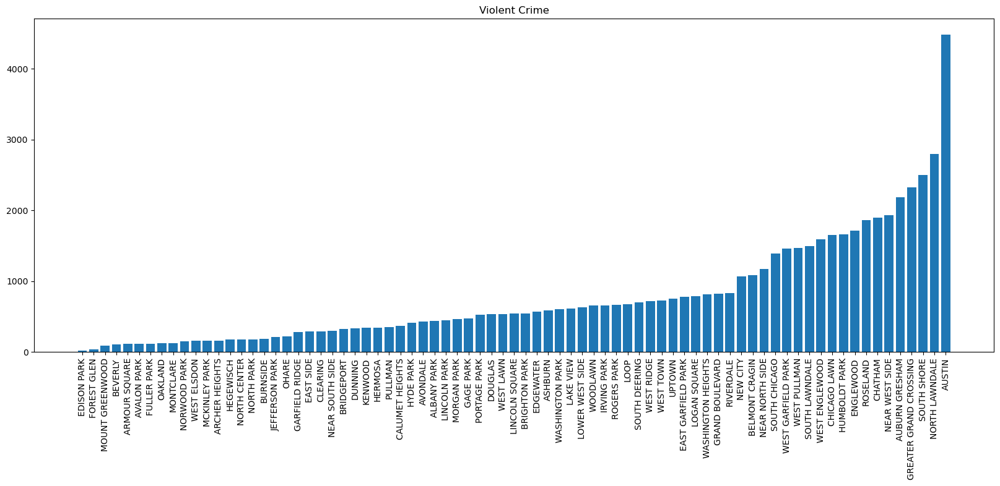

In [86]:
ccat="Violent Crime"
byTheft = df1[df1["crime_cat"] == ccat].groupby(["community"])["Case Number"].count().sort_values()
#byTheft = df1[df1["crime_cat"] == "Theft"].groupby(["community"])["Case Number"].count().sort_values()

#Homicide, Sexual Assault, Violent Crime, Narcotics

fig, ax = plt.subplots(figsize = [20,7])
ax.bar(byTheft.index, byTheft)
plt.title(ccat)
plt.xticks(rotation = 90)
plt.show()

Text(0.5, 1.0, 'Theft')

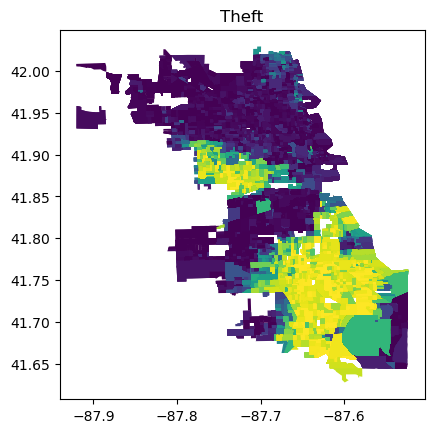

In [87]:
fig, ax = plt.subplots()
ax1 = df1[df1["crime_cat"] == "Theft"].plot(ax=ax, column='perc_black', legend=True, cax=cax1,
             legend_kwds ={'label': "Theft",'orientation': "horizontal"})
ax1.set_title("Theft")


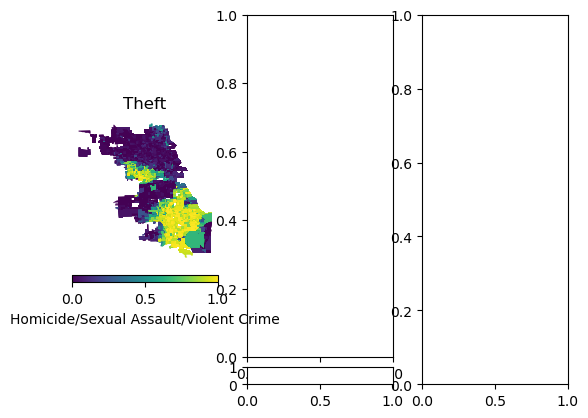

In [88]:
# Where is the crime?
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3)

divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("bottom", size="5%", pad=0.1)
ax1 = df1[df1["crime_cat"] == "Theft"].plot(ax=ax1, column='perc_black', legend=True, cax=cax1,
             legend_kwds ={'label': "Theft",'orientation': "horizontal"})
ax1.set_title("Theft")
ax1.set_axis_off()

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("bottom", size="5%", pad=0.1)
ax2 = df1[df1["crime_cat"].isin(["Homicide", "Sexual Assault", "Violent Crime"])].plot(ax=ax1, column='perc_black', legend=True, cax=cax1,
             legend_kwds ={'label': "Homicide/Sexual Assault/Violent Crime",'orientation': "horizontal"})
ax2.set_title("Theft")
ax2.set_axis_off()

# Sidebar - Predicting Rental Prices

In [89]:
rental_df1 = pd.read_csv(data_path + "Chicago_Rentals_Sample_Oct1923.csv")
rental_df2 = pd.read_csv(data_path + "Chicago_Rentals_Sample_Dec2023.csv")

rental_df = pd.concat([rental_df1, rental_df2], ignore_index=True).drop(columns=["Unnamed: 0"]).drop_duplicates()
print(len(rental_df))
print(rental_df.columns)


5809
Index(['property_id', 'listing_id', 'prop_type', 'latitude', 'longitude',
       'address', 'price', 'price_max', 'price_min', 'link', 'description'],
      dtype='object')


In [90]:
desc_lst = rental_df["description"]
desc_lst

0       { beds :null, beds_max :2, beds_min :1, baths_...
1       { beds :null, beds_max :2, beds_min :0, baths_...
2       { beds :null, beds_max :3, beds_min :1, baths_...
3       { beds :null, beds_max :2, beds_min :2, baths_...
4       { beds :null, beds_max :3, beds_min :1, baths_...
                              ...                        
7807    { beds :2, beds_max :null, beds_min :null, bat...
7808    { beds :1, beds_max :null, beds_min :null, bat...
7809    { beds :1, beds_max :null, beds_min :null, bat...
7810    { beds :1, beds_max :null, beds_min :null, bat...
7811    { beds :1, beds_max :null, beds_min :null, bat...
Name: description, Length: 5809, dtype: object

In [91]:
def clean_description(x):
    """ This function is to break out important info from description column of rentals data.
    need to put in a safety in case the value is null. the int() will cause an error"""
    lst = x.split(",")
    try: 
        beds = int(lst[0].split(":")[1])
    except: beds= 'NA'
        
    try:
        beds_max = int(lst[1].split(":")[1])
    except: beds_max = 'NA'
    
    try:
        beds_min = int(lst[2].split(":")[1])
    except:
        beds_min = 'NA'
    
    try:
        baths_min = float(lst[3].split(":")[1])
    except:
        baths_min = 'NA'
    try:
        baths_max = float(lst[4].split(":")[1])
    except:
        baths_max = 'NA'
    try:
        sqft_max = int(lst[10].split(":")[1])
    except:
        sqft_max ='NA'
    try:
        sqft_min = int(lst[11].split(":")[1])
    except:
        sqft_min = 'NA'
        
    ptype = lst[14].split(":")[1]
    
    dic = {"beds": beds, "beds_max": beds_max, "beds_min":beds_min, "baths_min":baths_min, "baths_max":baths_max,
          "sqft_max":sqft_max, "sqft_min":sqft_min, "property":ptype}
    
    return dic
    
    

In [92]:
#apply the function to get new description columns
j= rental_df["description"].apply(clean_description)
rentals = rental_df.merge(pd.DataFrame(list(j)), left_index=True, right_index=True).\
    drop(columns=["description","prop_type"])
rentals.head(3)


,property_id,listing_id,latitude,longitude,address,price,price_max,price_min,link,beds,beds_max,beds_min,baths_min,baths_max,sqft_max,sqft_min,property
0,9007626047,2959645239,41.923980,-87.697593,2340 N California Ave,NaN,3380.0,3380.0,https://www.realtor.com/realestateandhomes-det...,NA,2,1,1.0,2.0,1321,462,apartment
1,8002932843,2949506142,41.750045,-87.667300,1735 W 79TH ST,NaN,760.0,760.0,https://www.realtor.com/realestateandhomes-det...,NA,2,0,1.0,1.0,915,400,apartment
2,8609982816,2949505883,41.876605,-87.742419,4653 W JACKSON BLVD,NaN,980.0,980.0,https://www.realtor.com/realestateandhomes-det...,NA,3,1,1.0,1.0,1125,770,apartment


In [93]:
# Make a rental geopandas frame and convert lat long to geometry
rentals = gpd.GeoDataFrame(
    rentals,
    geometry=gpd.points_from_xy( rentals["longitude"], rentals["latitude"])#, crs="EPSG:4269"
)

rentals.drop(columns=["longitude", "latitude"], inplace=True)
#https://geopandas.org/en/latest/gallery/create_geopandas_from_pandas.html

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


In [94]:
"""f, ax = plt.subplots(figsize=[12,8])
df["geometry"].plot(ax=ax)
rentals.plot(ax=ax, color='red', markersize=5)
plt.title("Rentals")
"""

'f, ax = plt.subplots(figsize=[12,8])\ndf["geometry"].plot(ax=ax)\nrentals.plot(ax=ax, color=\'red\', markersize=5)\nplt.title("Rentals")\n'

In [95]:
# now we would want to join the rentals with the demo/crime data. For this dataset, since our objective focuses on rents,
# we would just want rows for rentals and nothing extra. rental dataset would be the dominant geometry.



In [96]:
# get crime counts wide per bg geometry
crime_cnts= df1.groupby(["bg_geometry","crime_cat"]).agg({"Case Number": "count"}).reset_index().\
    rename(columns={"Case Number":"Cnt"}). \
    pivot(index="bg_geometry", columns="crime_cat", values=["Cnt"]).reset_index()#.\

crime_cnts.columns = crime_cnts.columns.map('_'.join)

crime_cnts = crime_cnts.fillna(0)

crime_cnts.head(3)

,bg_geometry_,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime
0,"POLYGON ((-87.53165799999999 41.702716, -87.53...",0.0,2.0,14.0,0.0,7.0,17.0
1,"POLYGON ((-87.531661 41.708219, -87.5314789999...",0.0,0.0,15.0,0.0,15.0,13.0
2,"POLYGON ((-87.53166499999999 41.692192, -87.53...",0.0,0.0,30.0,0.0,17.0,12.0


In [97]:
# get arrests per bg geometry
arrests = df1.groupby(["bg_geometry"]).agg({"Arrest": "sum"}).reset_index().\
    rename(columns={"Case Number":"crime_cnt"})
arrests.head(3)

,bg_geometry,Arrest
0,"POLYGON ((-87.529831 41.595744, -87.529831 41....",0
1,"POLYGON ((-87.52987899999999 41.607268, -87.52...",0
2,"POLYGON ((-87.52989199999999 41.613821, -87.52...",0


In [98]:
# merge crime and arrests with demographics to have a clear view of stuff at block group level
bg_base = df.merge(crime_cnts,how="left", left_on="bg_geometry", right_on="bg_geometry_").drop(columns= "bg_geometry_").\
    merge(arrests, how="left", on="bg_geometry")

bg_base.iloc[:,39:] = bg_base.iloc[:,39:].fillna(0)
bg_base.head(3)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,pop_density,bg_inc_deciles,bg_geometry,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest
0,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,...,0.003544,Perc_10th,POLYGON ((-87.76798599999999 41.86554599999999...,0.0,0.0,1.0,0.0,1.0,1.0,0
1,17,031,820502,2,170318205022,Block Group 2,G5030,S,455769,0,...,0.002067,Perc_10th,"POLYGON ((-87.80959299999999 41.753446, -87.80...",NaN,0.0,0.0,0.0,0.0,0.0,0
2,17,031,672000,3,170316720003,Block Group 3,G5030,S,184727,0,...,0.002127,Perc_10th,"POLYGON ((-87.674745 41.764799, -87.6745019999...",0.0,1.0,66.0,0.0,28.0,39.0,21


In [99]:
# rentals last to merge, as we would be just adding block group info for rentals.
bdf=gpd.sjoin(rentals, bg_base, how="left", op="intersects").reset_index(drop=True).\
    drop(columns=["index_right"]).drop_duplicates()
print(len(bdf))
bdf.head(3)

4427


,property_id,listing_id,address,price,price_max,price_min,link,beds,beds_max,beds_min,...,pop_density,bg_inc_deciles,bg_geometry,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest
0,9007626047,2959645239,2340 N California Ave,NaN,3380.0,3380.0,https://www.realtor.com/realestateandhomes-det...,NA,2,1,...,0.009839,Perc_60th,"POLYGON ((-87.70231799999999 41.924763, -87.70...",0.0,2.0,26.0,0.0,68.0,37.0,18
1,8002932843,2949506142,1735 W 79TH ST,NaN,760.0,760.0,https://www.realtor.com/realestateandhomes-det...,NA,2,0,...,0.006108,Perc_10th,"POLYGON ((-87.668291 41.750293, -87.668048 41....",0.0,1.0,57.0,1.0,30.0,59.0,21
2,8609982816,2949505883,4653 W JACKSON BLVD,NaN,980.0,980.0,https://www.realtor.com/realestateandhomes-det...,NA,3,1,...,0.005548,Perc_10th,"POLYGON ((-87.74514599999999 41.876808, -87.74...",1.0,73.0,75.0,1.0,57.0,72.0,105


## Getting Insights Before Modeling
* data types
* Missing values
* Outliers
* variable distributions
* correlations
* New feature creation

In [100]:
# create a total crime column and a percent arrest

bdf["crime_tot"] = bdf.Cnt_Homicide + bdf.Cnt_Narcotics + bdf.Cnt_Other + bdf["Cnt_Sexual Assault"] + bdf.Cnt_Theft + bdf["Cnt_Violent Crime"]

bdf["arrest_perc"] = bdf["Arrest"]/bdf["crime_tot"]
bdf.head(3)

,property_id,listing_id,address,price,price_max,price_min,link,beds,beds_max,beds_min,...,bg_geometry,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest,crime_tot,arrest_perc
0,9007626047,2959645239,2340 N California Ave,NaN,3380.0,3380.0,https://www.realtor.com/realestateandhomes-det...,NA,2,1,...,"POLYGON ((-87.70231799999999 41.924763, -87.70...",0.0,2.0,26.0,0.0,68.0,37.0,18,133.0,0.135338
1,8002932843,2949506142,1735 W 79TH ST,NaN,760.0,760.0,https://www.realtor.com/realestateandhomes-det...,NA,2,0,...,"POLYGON ((-87.668291 41.750293, -87.668048 41....",0.0,1.0,57.0,1.0,30.0,59.0,21,148.0,0.141892
2,8609982816,2949505883,4653 W JACKSON BLVD,NaN,980.0,980.0,https://www.realtor.com/realestateandhomes-det...,NA,3,1,...,"POLYGON ((-87.74514599999999 41.876808, -87.74...",1.0,73.0,75.0,1.0,57.0,72.0,105,279.0,0.376344


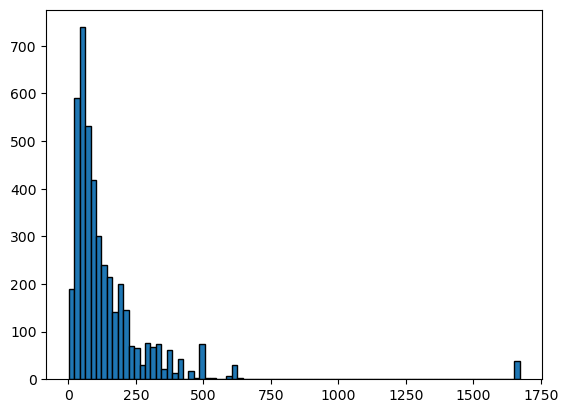

In [101]:
plt.hist(bdf["crime_tot"], edgecolor="black", bins = int(bdf["crime_tot"].max()/20))
plt.show()

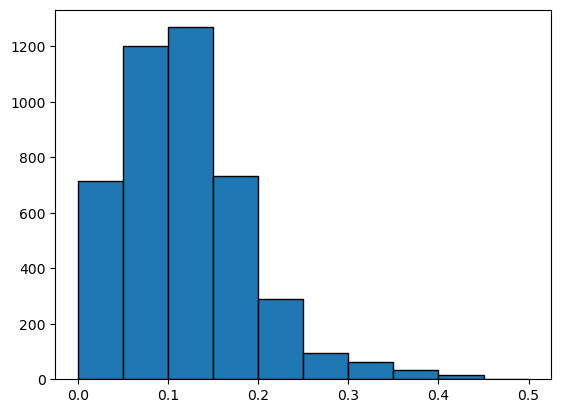

In [102]:
plt.hist(bdf["arrest_perc"], edgecolor="black")
plt.show()

In [103]:
# count missing values per column
missing_col=[bdf[i].isna().sum() for i in bdf.columns]
#bdf.isna().sum( axis=0)

missing_perc = [i/len(bdf) for i in missing_col]
missing_perc_df = pd.DataFrame({"col_name": bdf.columns, "prop_missing": missing_perc}).sort_values(by=['prop_missing'], ascending=False)
missing_perc_df


,col_name,prop_missing
4,price_max,0.850915
5,price_min,0.850915
3,price,0.150440
44,perc_>bachelor,0.055342
46,perc_inLaborForce,0.055342
...,...,...
13,sqft_min,0.000000
14,property,0.000000
15,geometry,0.000000
1,listing_id,0.000000


In [104]:
bdf.iloc[:,-12:]#.replace("NA", 0)#.fillna(0)

,pop_density,bg_inc_deciles,bg_geometry,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest,crime_tot,arrest_perc
0,0.009839,Perc_60th,"POLYGON ((-87.70231799999999 41.924763, -87.70...",0.0,2.0,26.0,0.0,68.0,37.0,18,133.0,0.135338
1,0.006108,Perc_10th,"POLYGON ((-87.668291 41.750293, -87.668048 41....",0.0,1.0,57.0,1.0,30.0,59.0,21,148.0,0.141892
2,0.005548,Perc_10th,"POLYGON ((-87.74514599999999 41.876808, -87.74...",1.0,73.0,75.0,1.0,57.0,72.0,105,279.0,0.376344
3,0.004533,Perc_10th,POLYGON ((-87.77500999999999 41.89100000000001...,0.0,4.0,64.0,1.0,57.0,54.0,24,180.0,0.133333
4,0.005371,Perc_10th,"POLYGON ((-87.66052999999999 41.732298, -87.66...",0.0,1.0,56.0,2.0,21.0,36.0,15,116.0,0.12931
...,...,...,...,...,...,...,...,...,...,...,...,...
4422,0.026874,Perc_70th,"POLYGON ((-87.64970000000001 41.954561, -87.64...",0.0,0.0,35.0,0.0,24.0,5.0,5,64.0,0.078125
4423,0.006727,Perc_50th,"POLYGON ((-87.663715 41.856021, -87.6636089999...",1.0,0.0,19.0,1.0,27.0,10.0,5,58.0,0.086207
4424,0.026874,Perc_70th,"POLYGON ((-87.64970000000001 41.954561, -87.64...",0.0,0.0,35.0,0.0,24.0,5.0,5,64.0,0.078125
4425,0.026874,Perc_70th,"POLYGON ((-87.64970000000001 41.954561, -87.64...",0.0,0.0,35.0,0.0,24.0,5.0,5,64.0,0.078125


Let's handle missing values. For beds, bath, and price will take minimums as default if a hard cut value is not provided.

In [105]:
#list(bdf.columns)
#bdf[bdf["beds1"] == "NA"]

In [106]:


bdf["beds1"] = np.where(bdf.beds == "NA", bdf.beds_min, bdf.beds)

bdf["baths1"] =  np.where(bdf.baths_min == "NA", bdf.baths_max, bdf.baths_min)
bdf["baths1"] =  np.where(bdf.baths1 == "NA", 0, bdf.baths1)

bdf["sqft1"] = np.where(bdf.sqft_min == "NA", bdf.sqft_max, bdf.sqft_min)
bdf["sqft1"] = np.where(bdf.sqft1 == "NA", 0 , bdf.sqft1 )

bdf["price1"] = np.where(bdf.price.isna(), bdf.price_min, bdf.price)

# NAs to 0
bdf.iloc[:,-12:] = bdf.iloc[:,-12:].fillna(0)
bdf.iloc[:,7:13] = bdf.iloc[:,7:13].replace("NA", 0)
bdf.iloc[:,3:6] = bdf.iloc[:,3:6].fillna(0)


bdf

,property_id,listing_id,address,price,price_max,price_min,link,beds,beds_max,beds_min,...,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest,crime_tot,arrest_perc,beds1,baths1,sqft1,price1
0,9007626047,2959645239,2340 N California Ave,0.0,3380.0,3380.0,https://www.realtor.com/realestateandhomes-det...,0,2,1,...,0.0,68.0,37.0,18,133.0,0.135338,1,1.0,462,3380.0
1,8002932843,2949506142,1735 W 79TH ST,0.0,760.0,760.0,https://www.realtor.com/realestateandhomes-det...,0,2,0,...,1.0,30.0,59.0,21,148.0,0.141892,0,1.0,400,760.0
2,8609982816,2949505883,4653 W JACKSON BLVD,0.0,980.0,980.0,https://www.realtor.com/realestateandhomes-det...,0,3,1,...,1.0,57.0,72.0,105,279.0,0.376344,1,1.0,770,980.0
3,8696432436,2949506095,447 N AUSTIN BLVD,0.0,1355.0,1355.0,https://www.realtor.com/realestateandhomes-det...,0,2,2,...,1.0,57.0,54.0,24,180.0,0.133333,2,1.0,750,1355.0
4,7246978678,2949506196,8951 S ADA ST,0.0,945.0,945.0,https://www.realtor.com/realestateandhomes-det...,0,3,1,...,2.0,21.0,36.0,15,116.0,0.129310,1,1.0,700,945.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4422,9334941241,2785422609,3833 N Broadway St Unit 3BED,5000.0,0.0,0.0,https://www.realtor.com/realestateandhomes-det...,2,0,0,...,0.0,24.0,5.0,5,64.0,0.078125,2,0.0,0,5000.0
4423,9382770697,2959283686,1338 W Cullerton St Apt 2E,2700.0,0.0,0.0,https://www.realtor.com/realestateandhomes-det...,2,0,0,...,1.0,27.0,10.0,5,58.0,0.086207,2,0.0,0,2700.0
4424,9198063463,2959756840,2212 W Lawrence Ave Unit 3E,3370.0,0.0,0.0,https://www.realtor.com/realestateandhomes-det...,1,0,0,...,0.0,24.0,5.0,5,64.0,0.078125,1,0.0,0,3370.0
4425,9192614950,2959626105,2009 W Jarvis Ave Apt 2,1900.0,0.0,0.0,https://www.realtor.com/realestateandhomes-det...,1,0,0,...,0.0,24.0,5.0,5,64.0,0.078125,1,0.0,0,1900.0


<AxesSubplot:>

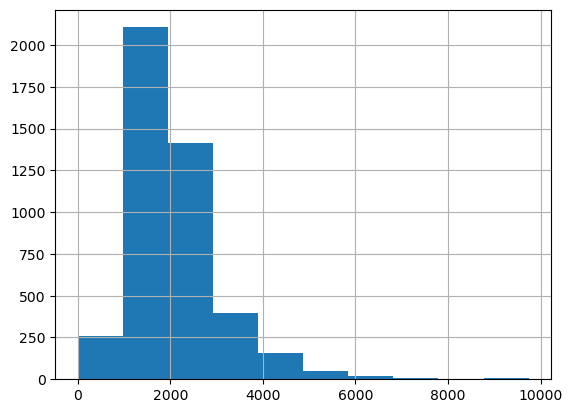

In [107]:
"""There's a rental price outlier. Get rid of it because it may be throwing everything off.
Did some checking and this is in logan square, 68% white, 60th percentile of income"""

bdf1 = bdf[bdf["price1"] < 10000]

bdf1["price1"].hist()

In [108]:
# Rows that have no price should be deleted from dataset, so as not to affect price modeling.
bdf1[bdf1["price1"] == 0]

bdf1 = bdf1[bdf1["price1"] != 0]



looks like only price is missing, but clearly beds has NAs.And baths_min as well It's because it's an object not a float. 
Will use min for both instances

In [109]:
print(bdf.dtypes[bdf.dtypes=="float64"])
print("-------")
print(bdf.dtypes[bdf.dtypes=="int64"])

price                 float64
price_max             float64
price_min             float64
baths_min             float64
baths_max             float64
ALAND                 float64
AWATER                float64
pop_total             float64
emp_total             float64
perc_white            float64
perc_black            float64
perc_hispanic         float64
perc_asian            float64
perc_native           float64
perc_other            float64
perc_mixed            float64
perc_hsgrad           float64
perc_bachelor         float64
perc_>bachelor        float64
income_medhh          float64
perc_inLaborForce     float64
perc_employed         float64
perc_unemployed       float64
pop_density           float64
Cnt_Homicide          float64
Cnt_Narcotics         float64
Cnt_Other             float64
Cnt_Sexual Assault    float64
Cnt_Theft             float64
Cnt_Violent Crime     float64
crime_tot             float64
arrest_perc           float64
baths1                float64
price1    

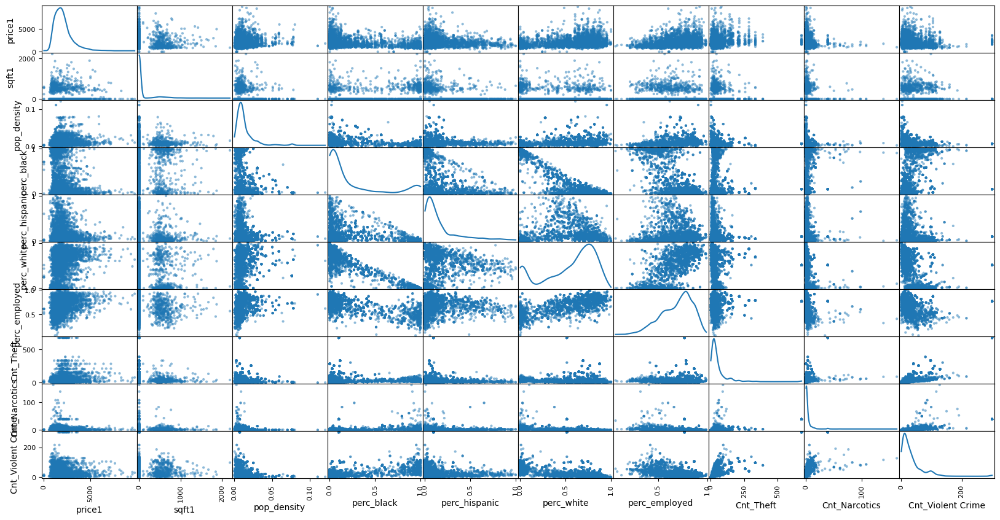

In [110]:
keep_vars = ["price1", "sqft1","beds1", 
             "pop_density",
             "perc_black","perc_hispanic", "perc_white",
             "perc_employed",#"income_medhh", 
             "Cnt_Theft", "Cnt_Narcotics", "Cnt_Violent Crime"]
pd.plotting.scatter_matrix(bdf1[keep_vars], diagonal = 'kde',  figsize=[20,10])
#plt.rcParams['figure.figsize'] = [20, 12]
plt.show()

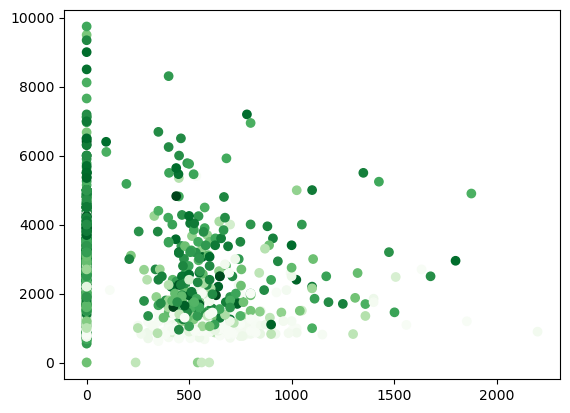

In [111]:
plt.scatter(bdf1["sqft1"],bdf1["price1"], c=bdf1["perc_white"],cmap="Greens")

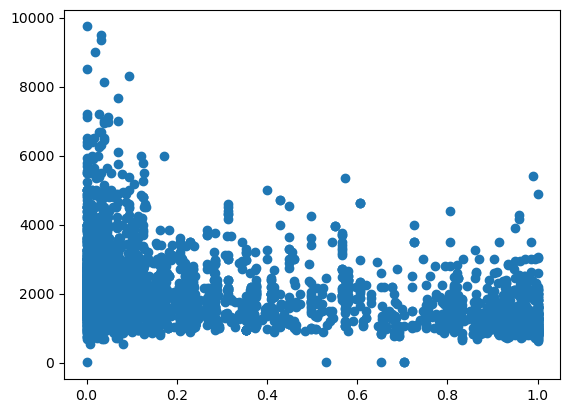

In [112]:
plt.scatter(bdf1["perc_black"],bdf1["price1"])#, c=bdf["perc_white"],cmap="Greens")

<AxesSubplot:>

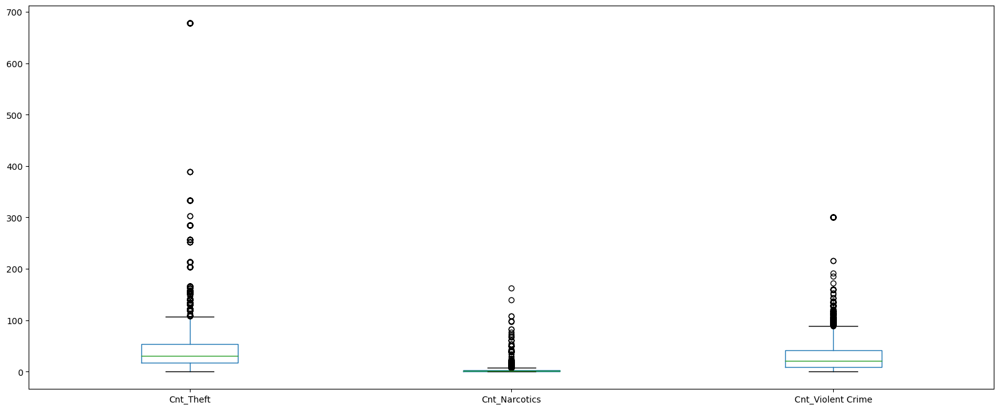

In [113]:
bdf1[["Cnt_Theft", "Cnt_Narcotics", "Cnt_Violent Crime"]].boxplot(figsize=[20,8], grid= False)



In [114]:
# corr plot
bdfcorr = bdf1.drop(columns=["price","baths_min","property_id","listing_id"]).corr()
bdfcorr.style.background_gradient(cmap='coolwarm')

,price_max,price_min,beds,beds_max,beds_min,baths_max,sqft_max,ALAND,AWATER,pop_total,emp_total,perc_white,perc_black,perc_hispanic,perc_asian,perc_native,perc_other,perc_mixed,perc_hsgrad,perc_bachelor,perc_>bachelor,income_medhh,perc_inLaborForce,perc_employed,perc_unemployed,pop_density,Cnt_Homicide,Cnt_Narcotics,Cnt_Other,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest,crime_tot,arrest_perc,baths1,sqft1,price1
price_max,1.000000,1.000000,-0.022463,0.334911,0.162225,0.359069,0.323383,0.007227,0.037964,0.070671,0.071544,-0.066158,0.068009,-0.089846,0.038543,-0.034506,-0.066309,-0.031171,-0.012896,-0.045332,0.073081,0.007882,-0.034031,-0.036589,0.019589,0.014330,0.050510,0.013393,0.055219,0.046988,0.051179,0.061644,0.042815,0.056722,0.006053,0.355910,0.290739,0.382302
price_min,1.000000,1.000000,-0.022463,0.334911,0.162225,0.359069,0.323383,0.007227,0.037964,0.070671,0.071544,-0.066158,0.068009,-0.089846,0.038543,-0.034506,-0.066309,-0.031171,-0.012896,-0.045332,0.073081,0.007882,-0.034031,-0.036589,0.019589,0.014330,0.050510,0.013393,0.055219,0.046988,0.051179,0.061644,0.042815,0.056722,0.006053,0.355910,0.290739,0.382302
beds,-0.022463,-0.022463,1.000000,-0.358604,-0.258373,-0.349259,-0.322289,0.013555,-0.013576,0.000355,-0.005363,-0.002150,-0.005570,0.053727,-0.012309,0.011201,0.029566,0.020424,0.023466,-0.015733,-0.027847,0.023340,-0.008539,-0.010339,0.008758,-0.013891,-0.013723,0.028735,0.001593,0.034006,0.000849,-0.003501,0.007752,0.001621,0.019268,-0.383842,-0.331679,0.063641
beds_max,0.334911,0.334911,-0.358604,1.000000,0.696993,0.896650,0.866738,0.001066,0.018645,-0.052469,-0.065395,-0.211163,0.229981,-0.059402,-0.080341,-0.018161,-0.025108,-0.064593,0.148091,-0.194765,-0.107762,-0.126660,-0.151478,-0.173850,0.125409,-0.054650,0.126730,0.013448,0.009250,-0.013294,-0.041928,0.071292,-0.001275,0.001228,0.031557,0.891543,0.832847,-0.002522
beds_min,0.162225,0.162225,-0.258373,0.696993,1.000000,0.542571,0.501706,0.002563,0.002410,-0.051707,-0.065565,-0.191505,0.205904,-0.037735,-0.075457,-0.026607,-0.014952,-0.047965,0.152687,-0.179165,-0.121564,-0.099844,-0.115092,-0.143344,0.127896,-0.069571,0.128315,0.015643,0.019998,0.001250,-0.028638,0.079231,0.009920,0.012846,0.042118,0.718885,0.733540,-0.022593
baths_max,0.359069,0.359069,-0.349259,0.896650,0.542571,1.000000,0.874002,0.006018,0.020335,-0.042177,-0.052741,-0.154596,0.169094,-0.047924,-0.057744,-0.011816,-0.022968,-0.047332,0.107962,-0.144817,-0.073437,-0.096106,-0.130342,-0.137217,0.072218,-0.033488,0.091041,-0.000510,-0.000107,-0.018329,-0.034201,0.044767,-0.011050,-0.005235,0.012556,0.878749,0.761323,0.039802
sqft_max,0.323383,0.323383,-0.322289,0.866738,0.501706,0.874002,1.000000,0.012660,0.035502,-0.040189,-0.049235,-0.163078,0.181465,-0.062775,-0.055097,-0.012703,-0.038617,-0.057844,0.110285,-0.149738,-0.071186,-0.094534,-0.130766,-0.141203,0.082421,-0.023280,0.101257,0.008716,0.009182,-0.007265,-0.031197,0.054616,-0.000687,0.002080,0.023066,0.794116,0.848294,0.014780
ALAND,0.007227,0.007227,0.013555,0.001066,0.002563,0.006018,0.012660,1.000000,0.439430,0.190280,0.169135,-0.044602,0.039775,0.037724,-0.008491,0.028374,0.014520,-0.015070,0.097991,-0.084266,-0.058449,0.029551,-0.071606,-0.068840,0.019988,-0.249165,0.156950,0.104988,0.255212,0.115450,0.261234,0.247132,0.208582,0.265704,0.059466,0.002627,-0.000952,0.023848
AWATER,0.037964,0.037964,-0.013576,0.018645,0.002410,0.020335,0.035502,0.439430,1.000000,0.178519,0.185238,-0.038877,0.034820,-0.066953,0.082237,-0.032957,-0.063887,-0.063305,-0.005870,-0.051042,0.105963,-0.002248,-0.096309,-0.080178,-0.009698,-0.033403,0.051184,-0.001910,0.101504,0.097827,0.074083,0.091721,0.065109,0.089774,0.005133,0.018994,0.024749,0.038908
pop_total,0.070671,0.070671,0.000355,-0.052469,-0.051707,-0.042177,-0.040189,0.190280,0.178519,1.000000,0.984380,0.139460,-0.221260,-0.052991,0.285056,-0.053601,-0.000633,0.027022,-0.251036,0.209377,0.271204,0.289531,0.148729,0.154631,-0.079578,0.083384,0.126090,0.232528,0.581091,0.32

## Making Predictions

Just for an exercise, can we make predictions on prices

We're going to predict price1, which is akin to the minimum price. So we'll use the other "1" variables that were crafted on minimums as well

In [148]:
from sklearn.model_selection import train_test_split
from sklearn import linear_model, metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
import math

In [116]:
c1 = bdf1[["property", "community", "ALAND"]]
c2 = bdf1.iloc[:, 35:]

dat = pd.concat([c1,c2],axis=1)
dat.drop(columns=["bg_geometry","comm_test"], inplace=True)
list(dat.columns)

['property',
 'community',
 'ALAND',
 'perc_white',
 'perc_black',
 'perc_hispanic',
 'perc_asian',
 'perc_native',
 'perc_other',
 'perc_mixed',
 'perc_hsgrad',
 'perc_bachelor',
 'perc_>bachelor',
 'income_medhh',
 'perc_inLaborForce',
 'perc_employed',
 'perc_unemployed',
 'pop_density',
 'bg_inc_deciles',
 'Cnt_Homicide',
 'Cnt_Narcotics',
 'Cnt_Other',
 'Cnt_Sexual Assault',
 'Cnt_Theft',
 'Cnt_Violent Crime',
 'Arrest',
 'crime_tot',
 'arrest_perc',
 'beds1',
 'baths1',
 'sqft1',
 'price1']

In [117]:
dat[dat["beds1"]=="NA"]

,property,community,ALAND,perc_white,perc_black,perc_hispanic,perc_asian,perc_native,perc_other,perc_mixed,...,Cnt_Sexual Assault,Cnt_Theft,Cnt_Violent Crime,Arrest,crime_tot,arrest_perc,beds1,baths1,sqft1,price1
1022,condos,NEAR NORTH SIDE,18761.0,0.717795,0.014608,0.018592,0.205843,0.0,0.000000,0.061753,...,0.0,2.0,5.0,3,12.0,0.250000,NA,0.0,0,5900.0
1069,condos,HERMOSA,261833.0,0.453462,0.000000,0.645570,0.152643,0.0,0.218913,0.174981,...,0.0,20.0,24.0,1,76.0,0.013158,NA,0.0,0,1520.0
1165,condos,NEAR WEST SIDE,122756.0,0.605323,0.068484,0.175917,0.169101,0.0,0.052256,0.104836,...,0.0,21.0,11.0,9,71.0,0.126761,NA,0.0,0,1595.0
1169,condos,NEAR WEST SIDE,468467.0,0.874503,0.000000,0.049587,0.103765,0.0,0.000000,0.021732,...,1.0,285.0,40.0,35,416.0,0.084135,NA,0.0,0,3995.0
1203,condos,HUMBOLDT PARK,248139.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,60.0,86.0,144,353.0,0.407932,NA,0.0,0,1250.0
1205,condos,WEST TOWN,165205.0,0.702840,0.101927,0.284483,0.038540,0.0,0.097870,0.058824,...,0.0,26.0,22.0,10,96.0,0.104167,NA,0.0,0,2575.0
1388,other,LOWER WEST SIDE,246924.0,0.392535,0.000000,0.634557,0.099940,0.0,0.476219,0.031306,...,1.0,27.0,10.0,5,58.0,0.086207,NA,0.0,0,750.0
1983,apartment,NEAR NORTH SIDE,24573.0,0.634096,0.024428,0.154886,0.210499,0.0,0.053015,0.077963,...,2.0,7.0,8.0,4,35.0,0.114286,NA,0.0,0,3250.0


In [118]:
dat.dtypes[dat.dtypes=="object"]
#keep property and bg_inc_deciles. Need to one hot encode

property          object
community         object
bg_inc_deciles    object
beds1             object
dtype: object

In [119]:
# since beds popped up as a object, suspected NAs. Remove these from dataset.
dat[dat["beds1"]=="NA"]
dat = dat[dat["beds1"]!="NA"]

dat["beds1"] = dat["beds1"].astype(int)

In [120]:
# one hot encode data
ohe_dat = pd.get_dummies(dat, columns = ["property","community","bg_inc_deciles"])
ohe_dat
                                      

,ALAND,perc_white,perc_black,perc_hispanic,perc_asian,perc_native,perc_other,perc_mixed,perc_hsgrad,perc_bachelor,...,bg_inc_deciles_Perc_10th,bg_inc_deciles_Perc_20th,bg_inc_deciles_Perc_30th,bg_inc_deciles_Perc_40th,bg_inc_deciles_Perc_50th,bg_inc_deciles_Perc_60th,bg_inc_deciles_Perc_70th,bg_inc_deciles_Perc_80th,bg_inc_deciles_Perc_90th,bg_inc_deciles_Top
0,141579.0,0.684853,0.064609,0.408471,0.068198,0.000000,0.076813,0.105528,0.132265,0.311623,...,0,0,0,0,0,1,0,0,0,0
1,122632.0,0.000000,0.993324,0.000000,0.000000,0.000000,0.000000,0.006676,0.244186,0.113953,...,1,0,0,0,0,0,0,0,0,0
2,190165.0,0.023697,0.940284,0.026540,0.000000,0.009479,0.026540,0.000000,0.334174,0.040353,...,1,0,0,0,0,0,0,0,0,0
3,264477.0,0.104254,0.871560,0.000000,0.000000,0.000000,0.012510,0.011676,0.436312,0.075095,...,1,0,0,0,0,0,0,0,0,0
4,191224.0,0.022395,0.977605,0.000000,0.000000,0.000000,0.000000,0.000000,0.436905,0.000000,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4422,51202.0,0.704215,0.012355,0.132994,0.109012,0.000000,0.031977,0.142442,0.018709,0.461179,...,0,0,0,0,0,0,1,0,0,0
4423,246924.0,0.392535,0.000000,0.634557,0.099940,0.000000,0.476219,0.031306,0.142631,0.124406,...,0,0,0,0,1,0,0,0,0,0
4424,51202.0,0.704215,0.012355,0.132994,0.109012,0.000000,0.031977,0.142442,0.018709,0.461179,...,0,0,0,0,0,0,1,0,0,0
4425,51202.0,0.704215,0.012355,0.132994,0.109012,0.000000,0.031977,0.142442,0.018709,0.461179,...,0,0,0,0,0,0,1,0,0,0


In [121]:
# count missing values per column
missing_col=[ohe_dat[i].isna().sum() for i in ohe_dat.columns]

missing_perc = [i/len(ohe_dat) for i in missing_col]
missing_perc_df = pd.DataFrame({"col_name": ohe_dat.columns, "prop_missing": missing_perc})#.sort_values(by=['prop_missing'], ascending=False)
missing_perc_df


,col_name,prop_missing
0,ALAND,0.000454
1,perc_white,0.055152
2,perc_black,0.055152
3,perc_hispanic,0.055152
4,perc_asian,0.055152
...,...,...
119,bg_inc_deciles_Perc_60th,0.000000
120,bg_inc_deciles_Perc_70th,0.000000
121,bg_inc_deciles_Perc_80th,0.000000
122,bg_inc_deciles_Perc_90th,0.000000


In [122]:
# look again for NA's that may fumble the model
ohe_dat = ohe_dat.dropna()
len(ohe_dat)

4149

In [123]:

X = ohe_dat.drop(columns=["price1"])

y = ohe_dat["price1"]

# splitting X and y into training and testing sets
X_train, X_test,\
    y_train, y_test = train_test_split(X, y,
                                       test_size=0.30,
                                       random_state=1)

In [124]:
# create linear regression object
reg = linear_model.LinearRegression()
 
# train the model using the training sets
lr_model = reg.fit(X_train, y_train)
 
# regression coefficients
#print('Coefficients: ', reg.coef_)
 
# variance score: 1 means perfect prediction
print('Variance score: {}'.format(lr_model.score(X_test, y_test)))
 


Variance score: 0.26018876973446126


In [125]:
y_pred = lr_model.predict(X_train)
residuals = y_pred - y_train

In [146]:

def regression_eval_fun(model, y, pred):
    """fitted model, y values, predictions"""
    
    # for ensemble like random forest
    #oob_score = model.oob_score_
    
    r2 = r2_score(y , pred)
    mse = mean_squared_error(y, pred)
    mape = mean_absolute_percentage_error(y, pred)
    rmse = math.sqrt(mse)

    print("R-Squared: ", r2)
    print("MSE: ", mse)
    print("RMSE: ", rmse)
    print("MAPE: ", mape)
    
    return

In [147]:
regression_eval_fun(lr_model, y_train, y_pred)

R-Squared:  0.29139411289714545
MSE:  675905.2741664613
RMSE:  822.1345839742185
MAPE:  0.765049640931726


Text(0.5, 1.0, 'Linear Regression Residuals')

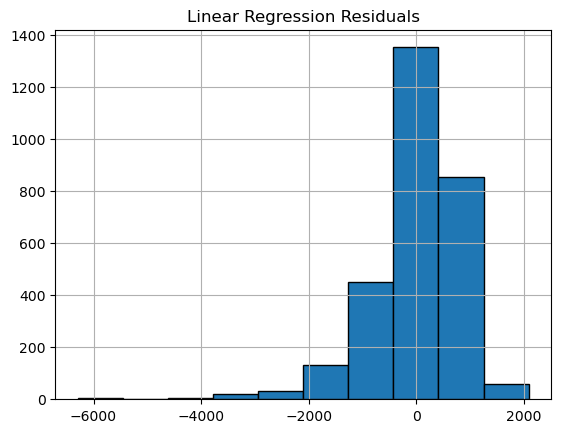

In [130]:
residuals.hist(edgecolor="black")
plt.title ("Linear Regression Residuals")

None-normal histogram/skewed data.

Text(0, 0.5, 'Residuals')

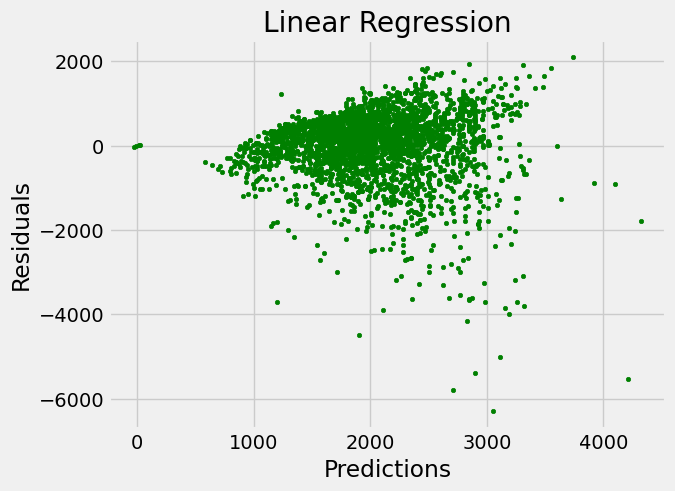

In [131]:
# plot for residual error
 
# setting plot style
plt.style.use('fivethirtyeight')
 
# plotting residual errors in training data
plt.scatter(y_pred,
            residuals,
            color="green", s=10,
            label='Train data')
plt.title("Linear Regression")
plt.xlabel("Predictions")
plt.ylabel("Residuals")
 

The above indicates heteroskedasticity. Unequal error variances.

Text(0, 0.5, 'Actuals')

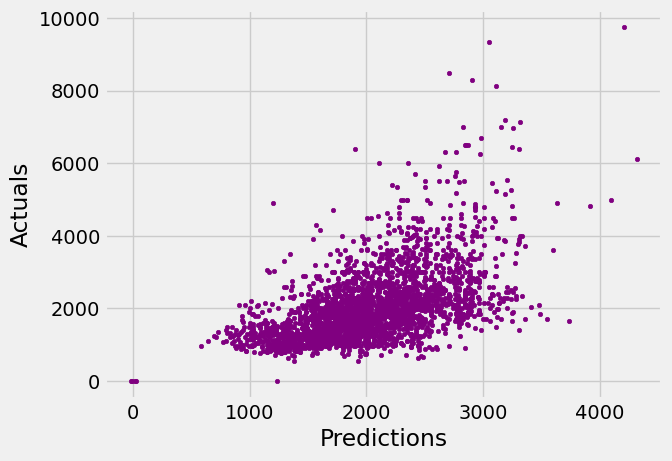

In [132]:
# plotting residual errors in training data
plt.scatter(y_pred,
            y_train,
            color="purple", s=10,
            label='Train data')
plt.xlabel("Predictions")
plt.ylabel("Actuals")

In [133]:
# Use statsmodel to train linear model because it gives more complete summary output
import statsmodels.api as sm

x, y = np.array(X_train), np.array(y_train)
x = sm.add_constant(x)
model = sm.OLS(y, x)

results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.291
Model:                            OLS   Adj. R-squared:                  0.262
Method:                 Least Squares   F-statistic:                     9.880
Date:                Fri, 22 Dec 2023   Prob (F-statistic):          1.49e-136
Time:                        09:07:29   Log-Likelihood:                -23612.
No. Observations:                2904   AIC:                         4.746e+04
Df Residuals:                    2787   BIC:                         4.816e+04
Df Model:                         116                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1132.4434    259.967      4.356      0.000     622.696    1642.191
x1          1.625e-05   4.58e-05      0.355      0.723   -7.36e-05       0.000
x2           819.0888    230.024      3.561      0.000     368.054    1270.124
x3           491.7652    255.935      1.921      0.055     -10.075     993.606
x4          -298.1612    241.261     -1.236      0.217    -771.229     174.907
x5          -150.7800    282.719     -0.533      0.594    -705.141     403.581
x6         -1968.4610   1082.188     -1.819      0.069   -4090.433     153.511
x7          1074.0174    348.841      3.079      0.002     390.005    1758.030
x8           866.8130    317.636      2.729      0.006     243.987    1489.639
x9          -551.5305    296.495     -1.860      0.063   -1132.903      29.842
x10         -349.7450    253.929     -1.377      0.169    -847.654     148.164
x11          -56.4360    257.453     -0.219      0.827    -561.254     448.382
x12            0.0020      0.002      1.137      0.256      -0.001       0.006
x13         3244.9426   6046.561      0.537      0.592   -8611.249    1.51e+04
x14        -3490.6333   6044.822     -0.577      0.564   -1.53e+04    8362.147
x15        -3929.3944   6078.380     -0.646      0.518   -1.58e+04    7989.187
x16           97.0794   1912.035      0.051      0.960   -3652.068    3846.227
x17          -50.6762     27.637     -1.834      0.067    -104.866       3.514
x18            3.0596      6.779      0.451      0.652     -10.233      16.352
x19            4.1910      5.382      0.779      0.436      -6.362      14.744
x20           42.0581     14.442      2.912      0.004      13.739      70.377
x21            0.4974      5.197      0.096      0.924      -9.693      10.688
x22           -0.1893      5.591     -0.034      0.973     -11.152      10.774
x23           -6.0805      2.830     -2.149      0.032     -11.630      -0.531
x24           -1.0594      5.197     -0.204      0.838     -11.251       9.132
x25         1003.7994    419.201      2.395      0.017     181.824    1825.775
x26           38.5453     13.858      2.782      0.005      11.373      65.718
x27          491.2229     85.856      5.721      0.000     322.875     659.571
x28           -0.1677      0.147     -1.139      0.255      -0.456       0.121
x29         -111.9771    115.944     -0.966      0.334    -339.323     115.369
x30         -367.0892    486.010     -0.755      0.450   -1320.066     585.887
x31          161.3706    122.737      1.315      0.189     -79.294     402.035
x32         -623.5335    770.822     -0.809      0.419   -2134.974     887.907
x33          151.1928    317.139      0.477      0.634    -470.658     773.044
x34         1157.9662    364.742      3.175      0.002     442.775    1873.157
x35          633.1747    247.701      2.556      0.011     147.480    1118.870
x3

In [134]:
#z=results.summary()
#pd.DataFrame(z.tables[1]).rename(columns=#.iloc[:,3:]#[z.tables[1]["P>|t|"] < .05]

The linear regression model performed very poorly. Some things that could explore to improve would be:
* feature selection...I know some of these variables are correlated
* transformations
* normalization
However, since the performance was so poor, I'm not going to bother exploring these right now and will try another model.

* how to assess/evaluate this model
 * Check R^2
 * Check the accuracy (I like MAPE)
 * Check some model assumptions: equal variances, normality, linearity, colinearity
* how to code this model from scratch
* cross validation
* try other models? Others from scratch
* think about price elasticity...is this something we can play around with based on the data we have


## Random Forest

In [135]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score


In [257]:
rf = RandomForestRegressor(random_state=303)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=303)

In [258]:
# Making predictions on the same data or new data
predictions = rf.predict(X_train)

print("random forest")
regression_eval_fun(rf, y_train, predictions)


random forest
R-Squared:  0.841254959337592
MSE:  151419.30399445974
RMSE:  389.12633423408874
MAPE:  0.8281526818189704


In [326]:
# Making predictions on new data
pred_tst = rf.predict(X_test)

print("random forest")
regression_eval_fun(rf, y_test, pred_tst)


random forest
R-Squared:  0.3562492678743696
MSE:  654591.8036850627
RMSE:  809.0684789837401
MAPE:  1.9900553258341425


In [138]:
rf_residuals = predictions - y_train

resrange = rf_residuals.max() - rf_residuals.min()


In [327]:
rf_residuals_tst = pred_tst - y_test

tst_resrange = rf_residuals_tst.max() - rf_residuals_tst.min()


Negative residuals means we under-predicted. Seems we have a wider spread of underpredictions

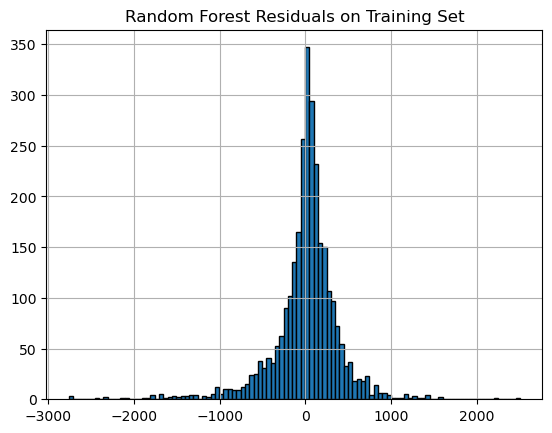

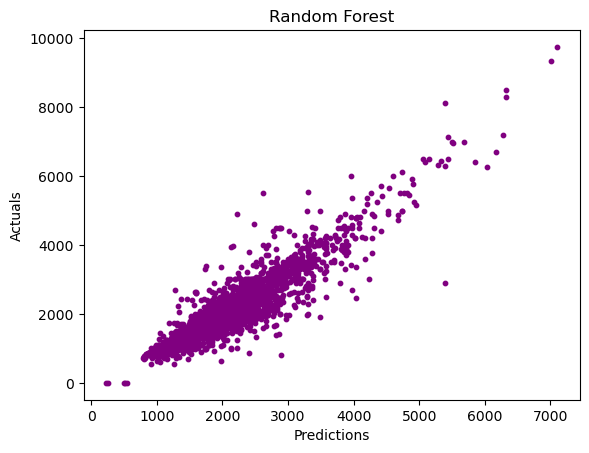

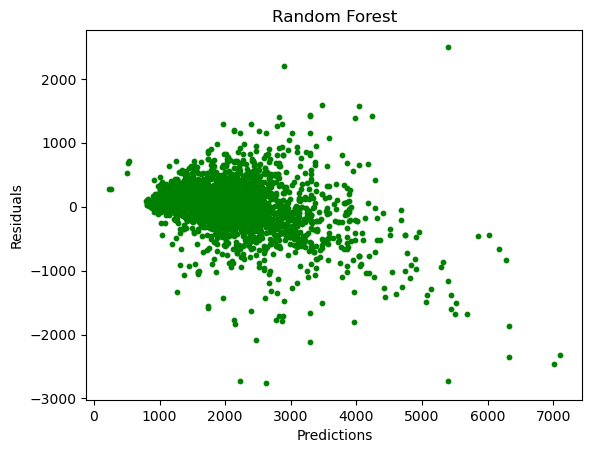

In [329]:
rf_residuals.hist(edgecolor="black", bins=round(resrange/50))
plt.title("Random Forest Residuals on Training Set")
plt.show()

plt.scatter(predictions, y_train,
            color="purple", s=10,
            label='Train data')
plt.title("Random Forest")
plt.xlabel("Predictions")
plt.ylabel("Actuals")

plt.show()

# plotting residual errors in training data
plt.scatter(predictions,
            rf_residuals,
            color="green", s=10,
            label='Train data')
plt.title("Random Forest")
plt.xlabel("Predictions")
plt.ylabel("Residuals")

plt.show()

plt.style.use('default')

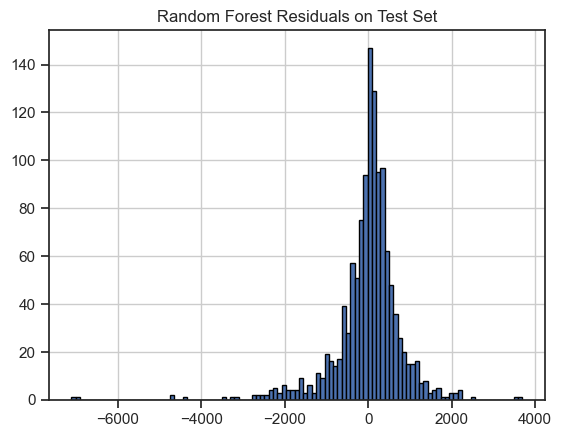

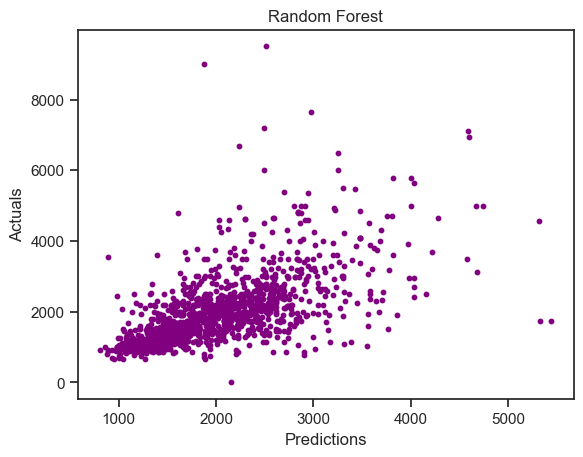

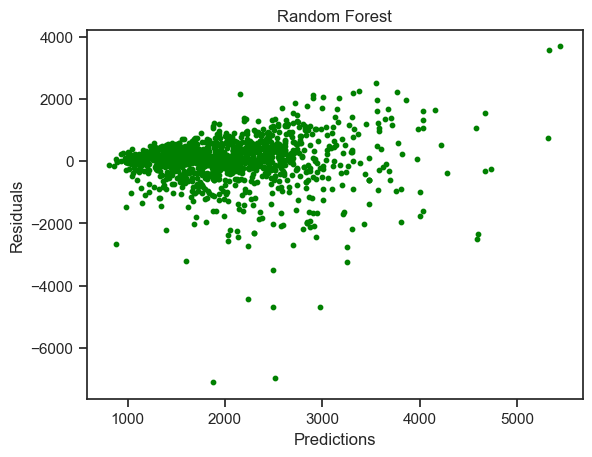

In [328]:
rf_residuals_tst.hist(edgecolor="black", bins=round(resrange/50))
plt.title("Random Forest Residuals on Test Set")
plt.show()

plt.scatter(pred_tst, y_test,
            color="purple", s=10,
            label='Test data')
plt.title("Random Forest")
plt.xlabel("Predictions")
plt.ylabel("Actuals")

plt.show()

# plotting residual errors in training data
plt.scatter(pred_tst,
            rf_residuals_tst,
            color="green", s=10,
            label='Test data')
plt.title("Random Forest")
plt.xlabel("Predictions")
plt.ylabel("Residuals")

plt.show()

plt.style.use('default')

In [140]:
# put error into buckets to see for each bucket, what percentage of errors landed there.
# This just gives a more real-world idea of performance

err_buckets = np.where(residuals.abs() < 100, "Err<100",
         np.where(residuals.abs() < 200, "Err100_200",
                 np.where(residuals.abs() < 500, "Err200_500",
                         np.where(residuals.abs() < 1000, "Err500_1000",
                                 "Err>1000"))))

err_buckets = pd.Series(err_buckets)
err_buckets.value_counts()

Err200_500     904
Err500_1000    883
Err>1000       446
Err100_200     341
Err<100        330
dtype: int64

In [237]:
err_buckets = pd.cut(residuals.abs(), bins=[0, 100, 200,300,500,1000, float('Inf')], labels=['Err<100', 'Err100_200',
                                                                                       'Err200_300',
                                                                                       'Err300_500', 'Err500_1000',
                                                                                      'Err>1000'])

err_buckets = pd.Series(err_buckets)
err_buckets.value_counts()

Err500_1000    883
Err300_500     595
Err>1000       446
Err100_200     341
Err<100        330
Err200_300     309
Name: price1, dtype: int64

In [238]:
print("Within $200 off: ", (err_buckets.value_counts()[4] + err_buckets.value_counts()[3])/len(err_buckets))
print("Within $500 off: ", (err_buckets.value_counts()[4] + err_buckets.value_counts()[3] + err_buckets.value_counts()[0])/len(err_buckets))

# So only about 55% of listings got a prediction within $500 of actual price
# this is for the linear model

Within $200 off:  0.23106060606060605
Within $500 off:  0.5351239669421488


In [143]:
#Feature Importance
# impurity importance...mean decrease impurity

z = pd.DataFrame(X.columns, rf.feature_importances_ ).reset_index()\
.rename(columns={"index":"importance", "0":"feature"}) \
.sort_values("importance", ascending=False)

z.head(20)

# note: look into importance using SHAP values

,importance,0
11,0.186094,income_medhh
25,0.098943,beds1
27,0.048383,sqft1
10,0.041107,perc_>bachelor
4,0.039475,perc_asian
26,0.030581,baths1
24,0.028262,arrest_perc
18,0.026433,Cnt_Other
1,0.025901,perc_white
15,0.025610,pop_density


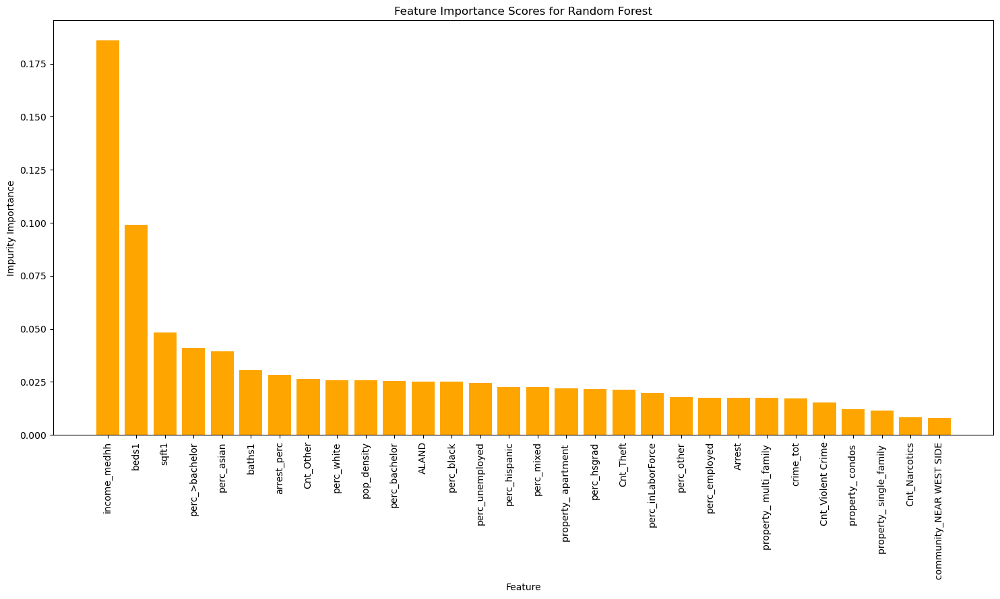

In [155]:
fig, ax = plt.subplots(figsize=[18,8])
ax.bar(z.iloc[:30,1], z["importance"].head(30), color="orange")
ax.set_title("Feature Importance Scores for Random Forest")
ax.set_xlabel("Feature")
ax.set_ylabel("Impurity Importance")
plt.xticks(rotation = 90)

plt.show()

## What can be done to get more accurate predictions
* Let's look into what type of properties performed well
    * Maybe we need more than one model
    * Maybe we need to be more careful about what we include in training sample
    * Maybe we need to re-evaluate our features... many properties do have a range for price and characteristics, and we're just using the floor, which could be throwing things off.
* increase the amount of data
* hyperparameter tuning is an option


In [202]:
top_features = list(z.iloc[:30,1])

eval_df = pd.concat([X_train[top_features].reset_index(), y_train.reset_index(drop=True),
           pd.DataFrame(pd.Series(predictions), columns=['predictions']),
           pd.DataFrame(rf_residuals).rename( columns={"price1":"rf_residuals"}).reset_index(drop=True)], axis=1)
eval_df["<200_err"] = np.where(abs(eval_df["rf_residuals"]) < 200, 1, 0)

eval_df.head(3)

,index,income_medhh,beds1,sqft1,perc_>bachelor,perc_asian,baths1,arrest_perc,Cnt_Other,perc_white,...,property_ multi_family,crime_tot,Cnt_Violent Crime,property_ condos,property_ single_family,Cnt_Narcotics,community_NEAR WEST SIDE,price1,predictions,rf_residuals
0,2541,196993.0,0,0,0.468346,0.291306,0.0,0.073171,55.0,0.634502,...,0,164.0,30.0,0,0,0.0,0,1654.0,2129.524961,475.524961
1,3719,79417.0,1,0,0.512876,0.276669,0.0,0.037037,36.0,0.405368,...,0,81.0,8.0,0,0,1.0,0,2869.0,2822.841357,-46.158643
2,960,36226.0,4,0,0.041723,0.000000,0.0,0.181102,59.0,0.023182,...,0,127.0,39.0,0,1,1.0,0,1158.0,1249.850000,91.850000


In [206]:
eval_df["<200_err"].value_counts()/len(eval_df)

1    0.585055
0    0.414945
Name: <200_err, dtype: float64

In [209]:
fair_df = eval_df[eval_df["<200_err"] == 1]

poor_df = eval_df[eval_df["<200_err"] == 0]
poor_df.describe()

,index,income_medhh,beds1,sqft1,perc_>bachelor,perc_asian,baths1,arrest_perc,Cnt_Other,perc_white,...,crime_tot,Cnt_Violent Crime,property_ condos,property_ single_family,Cnt_Narcotics,community_NEAR WEST SIDE,price1,predictions,rf_residuals,<200_err
count,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.00000,1205.000000,...,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.0
mean,2175.087967,89665.105394,1.477178,76.919502,0.296084,0.099227,0.156846,0.108236,52.93195,0.594431,...,147.794191,29.965975,0.117842,0.070539,2.390041,0.149378,2363.713693,2349.913140,-13.800553,0.0
std,1310.966675,49892.120705,1.291623,231.387644,0.147086,0.105025,0.400743,0.063728,76.52593,0.255540,...,207.250568,39.424152,0.322555,0.256160,6.546199,0.356608,1245.374637,888.252422,594.212454,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,...,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,272.460000,-2756.513292,0.0
25%,978.000000,53153.000000,0.000000,0.000000,0.188000,0.030418,0.000000,0.060976,19.00000,0.458889,...,49.000000,9.000000,0.000000,0.000000,0.000000,0.000000,1475.000000,1742.928000,-397.095833,0.0
50%,2091.000000,82685.000000,1.000000,0.000000,0.307175,0.075457,0.000000,0.101124,32.00000,0.677081,...,87.000000,19.000000,0.000000,0.000000,1.000000,0.000000,2100.000000,2188.425143,222.490000,0.0
75%,3340.000000,124594.000000,2.000000,0.000000,0.393351,0.137237,0.000000,0.145791,63.00000,0.787234,...,174.000000,37.000000,0.000000,0.000000,2.000000,0.000000,2995.000000,2726.423333,361.491048,0.0
max,4426.000000,236389.000000,11.000000,2200.000000,0.806366,0.918653,3.000000,0.432203,646.00000,1.000000,...,1672.000000,301.000000,1.000000,1.000000,98.000000,1.000000,9744.000000,7431.925417,2498.573333,0.0


In [236]:
fair_df.describe()

,index,income_medhh,beds1,sqft1,perc_>bachelor,perc_asian,baths1,arrest_perc,Cnt_Other,perc_white,...,crime_tot,Cnt_Violent Crime,property_ condos,property_ single_family,Cnt_Narcotics,community_NEAR WEST SIDE,price1,predictions,rf_residuals,<200_err
count,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,...,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.000000,1699.0
mean,2253.109476,71113.789288,1.371984,62.697469,0.241225,0.083404,0.121248,0.119471,45.765156,0.513275,...,124.923484,31.626251,0.107122,0.049441,3.001177,0.060035,1796.466157,1814.142727,17.676570,1.0
std,1265.600650,45163.753579,1.187118,193.957803,0.166251,0.112913,0.337160,0.071905,54.192027,0.302961,...,148.225463,35.101717,0.309359,0.216850,8.717055,0.237622,630.865137,600.743786,98.021127,0.0
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,695.000000,792.000000,-199.943288,1.0
25%,1208.000000,38873.000000,0.000000,0.000000,0.098832,0.001938,0.000000,0.071429,19.000000,0.274775,...,51.000000,9.000000,0.000000,0.000000,0.000000,0.000000,1325.000000,1369.496875,-44.439653,1.0
50%,2280.000000,67019.000000,1.000000,0.000000,0.230655,0.053073,0.000000,0.117647,32.000000,0.604144,...,83.000000,21.000000,0.000000,0.000000,1.000000,0.000000,1740.000000,1761.578491,20.700000,1.0
75%,3369.000000,97188.000000,2.000000,0.000000,0.360773,0.109908,0.000000,0.152941,59.000000,0.761340,...,155.000000,41.000000,0.000000,0.000000,3.000000,0.000000,2150.000000,2133.360595,93.258571,1.0
max,4419.000000,230781.000000,6.000000,1634.000000,0.806366,0.723026,2.000000,0.500000,646.000000,1.000000,...,1672.000000,301.000000,1.000000,1.000000,163.000000,1.000000,4715.000000,4669.050667,199.846667,1.0


In [212]:
len(poor_df[poor_df["rf_residuals"] < 0])/len(poor_df)

0.44481327800829873

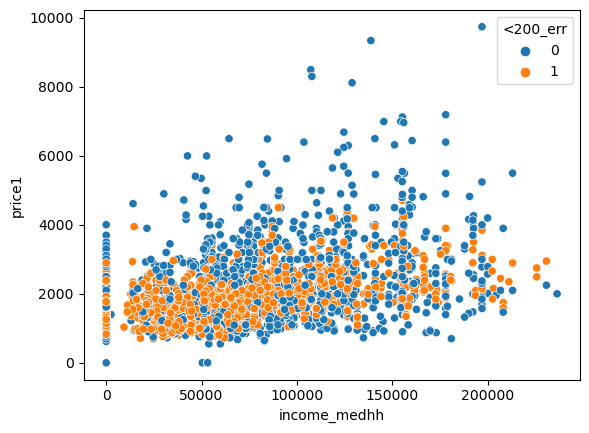

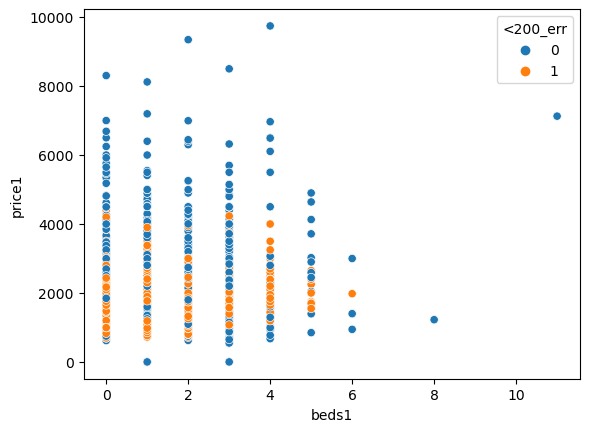

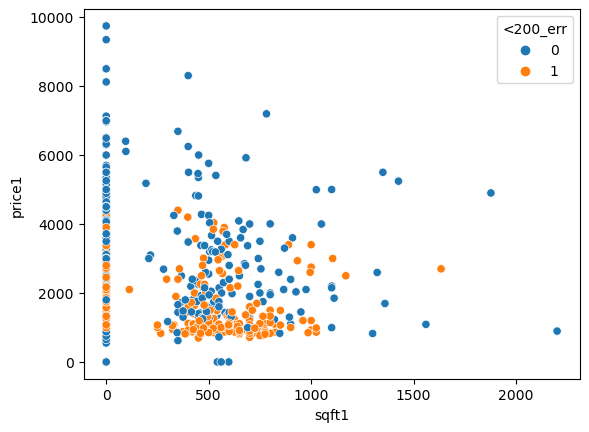

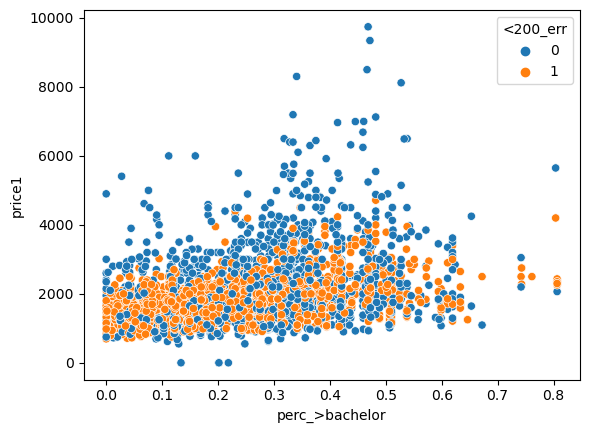

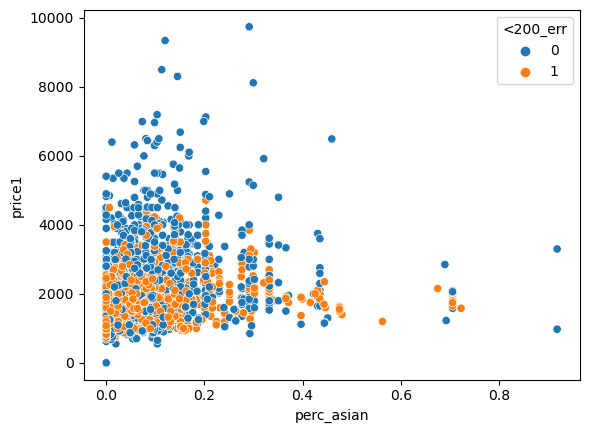

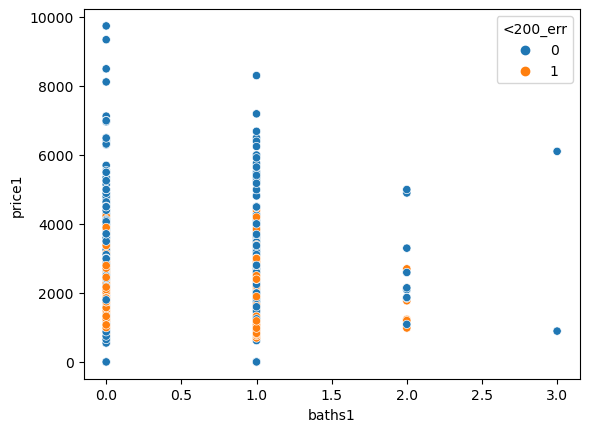

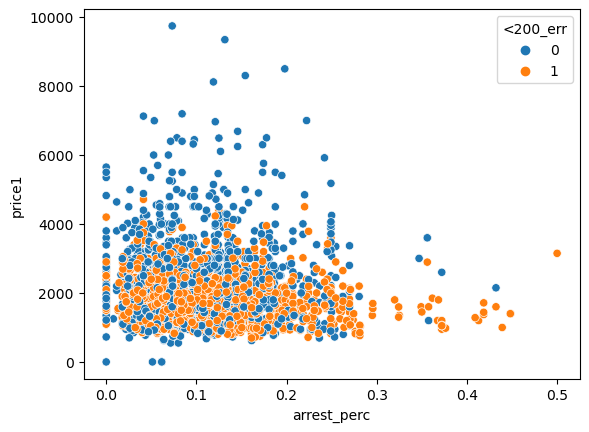

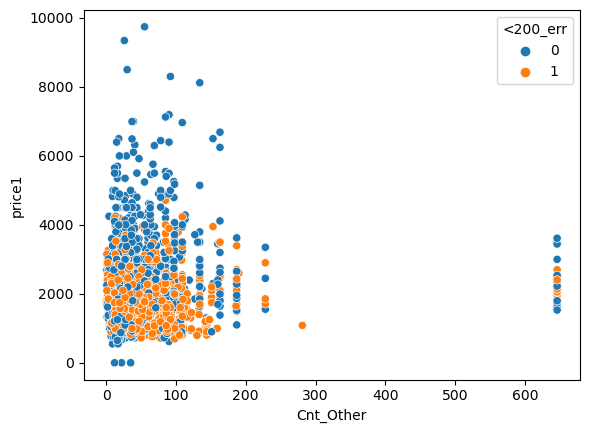

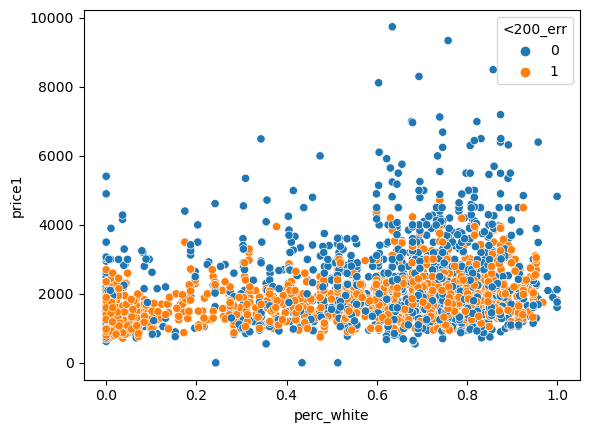

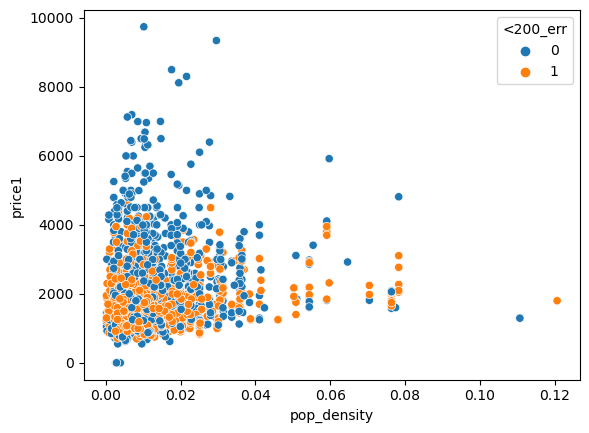

In [235]:
#plt.scatter(eval_df["sqft1"],eval_df["price1"], c=eval_df["<200_err"])
#plt.xlabel("sqft1")

import seaborn as sns

for i in eval_df.iloc[:,1:11].columns:
    sns.scatterplot(x=i, y='price1', data=eval_df, hue='<200_err')

    plt.show()

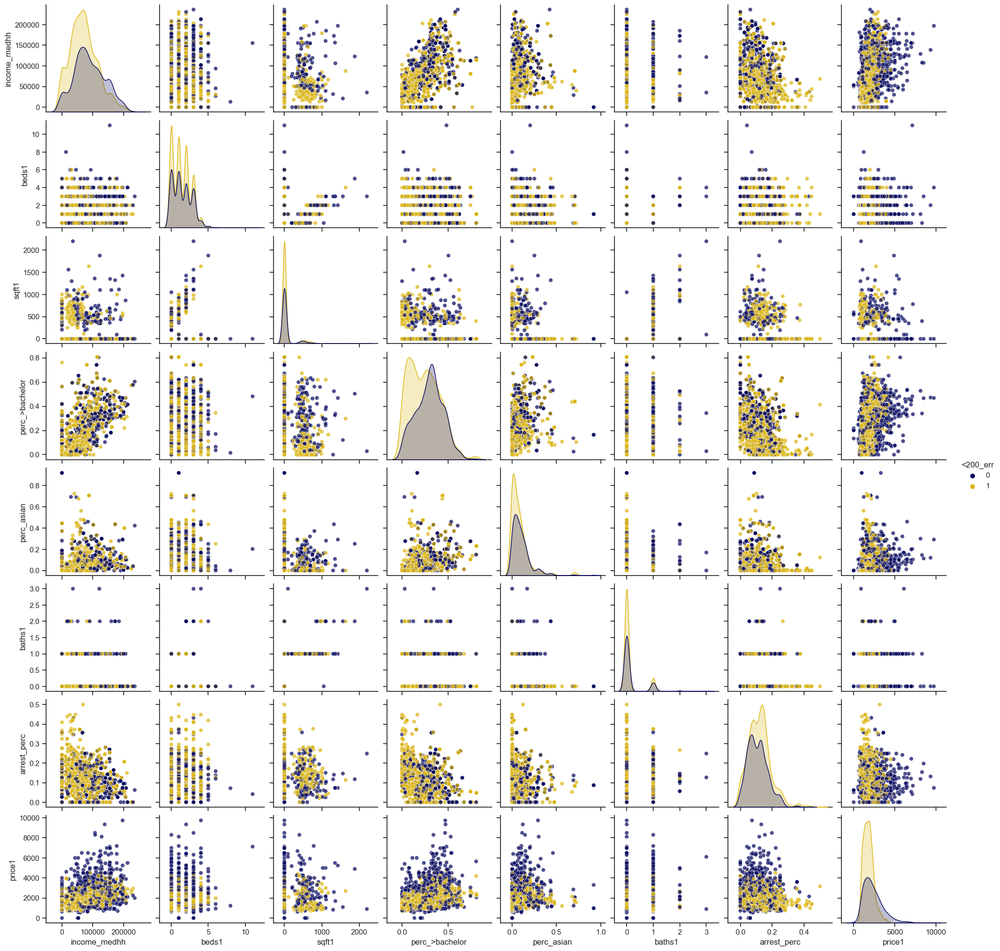

In [247]:

sns.set(style="ticks", color_codes=True);
# Create a custom color palete
palette = sns.xkcd_palette(['dark blue',  'gold'])
# Make the pair plot with a some aesthetic changes
sns.pairplot(eval_df[["income_medhh","beds1","sqft1","perc_>bachelor",
                      "perc_asian", "baths1", "arrest_perc", "price1","<200_err"]], hue = '<200_err', diag_kind = 'kde', palette= palette, plot_kws=dict(alpha = 0.7),
                   diag_kws=dict(shade=True))


In [249]:
print("% of data with missing bath1: ", len(eval_df[eval_df["baths1"] == 0])/len(eval_df))
print("% of data with missing sqft1: ", len(eval_df[eval_df["sqft1"] == 0])/len(eval_df))
#sqft1 is an important var, yet it's missing data (at 0) for more than half the samples. Probably sould take it out.
# Same for baths1

% of data with missing bath1:  0.8712121212121212
% of data with missing sqft1:  0.8870523415977961


In [239]:
X_train.head(3)

,ALAND,perc_white,perc_black,perc_hispanic,perc_asian,perc_native,perc_other,perc_mixed,perc_hsgrad,perc_bachelor,...,bg_inc_deciles_Perc_10th,bg_inc_deciles_Perc_20th,bg_inc_deciles_Perc_30th,bg_inc_deciles_Perc_40th,bg_inc_deciles_Perc_50th,bg_inc_deciles_Perc_60th,bg_inc_deciles_Perc_70th,bg_inc_deciles_Perc_80th,bg_inc_deciles_Perc_90th,bg_inc_deciles_Top
2541,215477.0,0.634502,0.000000,0.040510,0.291306,0.0,0.0,0.074192,0.000000,0.472222,...,0,0,0,0,0,0,0,0,0,1
3719,140995.0,0.405368,0.267722,0.080523,0.276669,0.0,0.0,0.050241,0.045064,0.252146,...,0,0,0,0,0,1,0,0,0,0
960,180774.0,0.023182,0.959958,0.027397,0.000000,0.0,0.0,0.016860,0.348587,0.052490,...,0,1,0,0,0,0,0,0,0,0


Notes:
* about 44% of the instances with a greater than $200 error, have an underprediction error (prediction smaller than actual)
* rents above about $5500 get poor predictions
* more than half of the samples have value 0 for sqft and baths (I'm going to assume that every prop should have at least one bathroom)

In [256]:
# Let's try retraining and taking out these two variables that have faulty info

rf2 = RandomForestRegressor(random_state=303)
rf2.fit(X_train.drop(['sqft1', 'baths1'], axis=1), y_train)

# Making predictions on the same data or new data
rf_pred2 = rf2.predict(X_train.drop(['sqft1', 'baths1'], axis=1))

print("random forest 2")
regression_eval_fun(rf2, y_train, rf_pred2)

rf2_residuals = rf_pred2 - y_train

resrange2 = rf2_residuals.max() - rf2_residuals.min()


random forest 2
R-Squared:  0.7696753760739931
MSE:  219695.64593724316
RMSE:  468.71702117294944
MAPE:  0.6556239407894556


MAPE is better, but everything else is worse from the first model. This may be because the other two accuracy metrics penalizes larger errors more (because of the squaring).

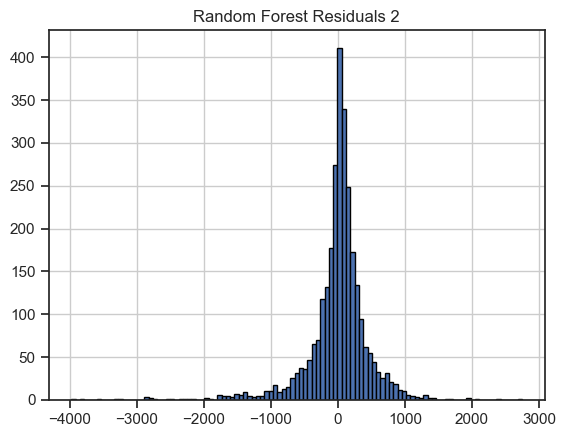

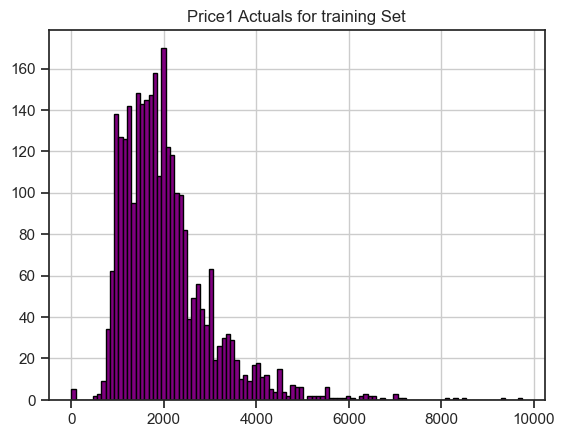

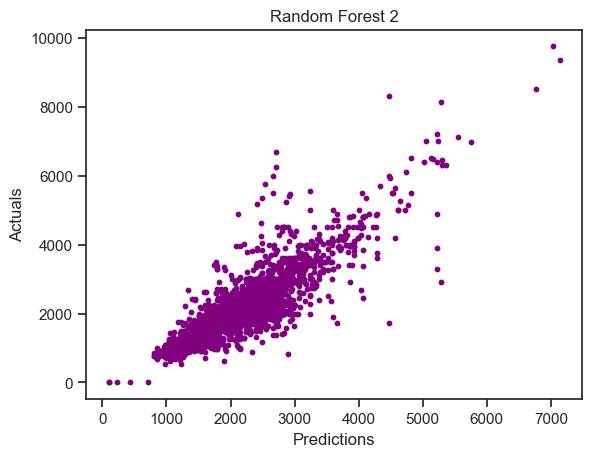

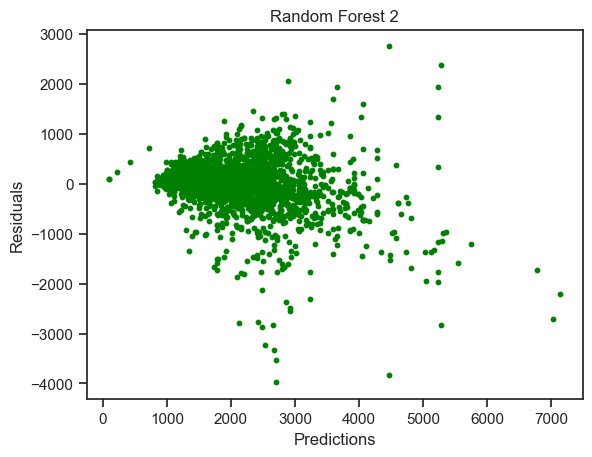

In [250]:
rf2_residuals.hist(edgecolor="black", bins=round(resrange/50))
plt.title("Random Forest Residuals 2")
plt.show()


y_train.hist(edgecolor="black", color="purple",bins=round(resrange/50))
plt.title("Price1 Actuals for training Set")
plt.show()

plt.scatter(rf_pred2, y_train,
            color="purple", s=10,
            label='Train data')
plt.title("Random Forest 2")
plt.xlabel("Predictions")
plt.ylabel("Actuals")

plt.show()

# plotting residual errors in training data
plt.scatter(rf_pred2,
            rf2_residuals,
            color="green", s=10,
            label='Train data')
plt.title("Random Forest 2")
plt.xlabel("Predictions")
plt.ylabel("Residuals")

plt.show()

plt.style.use('default')

In [243]:
#Feature Importance
# impurity importance...mean decrease impurity

rf2_importance = pd.DataFrame(X.drop(['sqft1', 'baths1'], axis=1).columns, rf2.feature_importances_ ).reset_index()\
.rename(columns={"index":"importance", "0":"feature"}) \
.sort_values("importance", ascending=False)

rf2_importance.head(20)

,importance,0
11,0.202078,income_medhh
25,0.127570,beds1
4,0.043057,perc_asian
10,0.041587,perc_>bachelor
18,0.031408,Cnt_Other
24,0.031367,arrest_perc
0,0.028990,ALAND
2,0.027565,perc_black
15,0.027111,pop_density
3,0.026943,perc_hispanic


The model seems to perform better despite the heavy 0 presence in square feet and baths. So let's keep these variables in and think about sampling/tuning OR features

In [259]:
# Let's try retraining with original feature list, but adjusting the rf parameters

rf3 = RandomForestRegressor(n_estimators=1000, random_state=303)
rf3.fit(X_train, y_train)

# Making predictions on the same data or new data
rf_pred3 = rf3.predict(X_train)

print("random forest 3")
regression_eval_fun(rf3, y_train, rf_pred3)

rf3_residuals = rf_pred3 - y_train

resrange3 = rf3_residuals.max() - rf3_residuals.min()

#accuracy change with adding more estimators seems negligble.

random forest 3
R-Squared:  0.8439189622308493
MSE:  148878.23901218988
RMSE:  385.8474297078962
MAPE:  0.833042408417703


In [ ]:
# There is some room for improvement with high valued properties. Can we see what variables make these apartments worth more
# and then try to adjust features for that?

In [270]:
eval_df["high_price"] = np.where(eval_df["price1"] > 5500, 1, 0)

hc = ohe_dat.merge(eval_df[["index","predictions","rf_residuals","<200_err","high_price"]], left_index=True, right_on="index")#[eval_df["price1"] > 5500]
hc.head(3)



,ALAND,perc_white,perc_black,perc_hispanic,perc_asian,perc_native,perc_other,perc_mixed,perc_hsgrad,perc_bachelor,...,bg_inc_deciles_Perc_60th,bg_inc_deciles_Perc_70th,bg_inc_deciles_Perc_80th,bg_inc_deciles_Perc_90th,bg_inc_deciles_Top,index,predictions,rf_residuals,<200_err,high_price
1217,141579.0,0.684853,0.064609,0.408471,0.068198,0.000000,0.076813,0.105528,0.132265,0.311623,...,1,0,0,0,0,0,2906.751667,-473.248333,0,0
1593,190165.0,0.023697,0.940284,0.026540,0.000000,0.009479,0.026540,0.000000,0.334174,0.040353,...,0,0,0,0,0,2,1013.300000,33.300000,1,0
1812,145946.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.175926,0.063657,...,0,0,0,0,0,5,895.550000,-14.450000,1,0


In [272]:
list(hc.columns)

['ALAND',
 'perc_white',
 'perc_black',
 'perc_hispanic',
 'perc_asian',
 'perc_native',
 'perc_other',
 'perc_mixed',
 'perc_hsgrad',
 'perc_bachelor',
 'perc_>bachelor',
 'income_medhh',
 'perc_inLaborForce',
 'perc_employed',
 'perc_unemployed',
 'pop_density',
 'Cnt_Homicide',
 'Cnt_Narcotics',
 'Cnt_Other',
 'Cnt_Sexual Assault',
 'Cnt_Theft',
 'Cnt_Violent Crime',
 'Arrest',
 'crime_tot',
 'arrest_perc',
 'beds1',
 'baths1',
 'sqft1',
 'price1',
 'property_ apartment ',
 'property_ condo_townhome ',
 'property_ condos ',
 'property_ coop ',
 'property_ duplex_triplex ',
 'property_ multi_family ',
 'property_ other ',
 'property_ single_family ',
 'property_ townhomes ',
 'property_null',
 'community_ALBANY PARK',
 'community_ARCHER HEIGHTS',
 'community_ARMOUR SQUARE',
 'community_ASHBURN',
 'community_AUBURN GRESHAM',
 'community_AUSTIN',
 'community_AVALON PARK',
 'community_AVONDALE',
 'community_BELMONT CRAGIN',
 'community_BRIDGEPORT',
 'community_BRIGHTON PARK',
 'communit

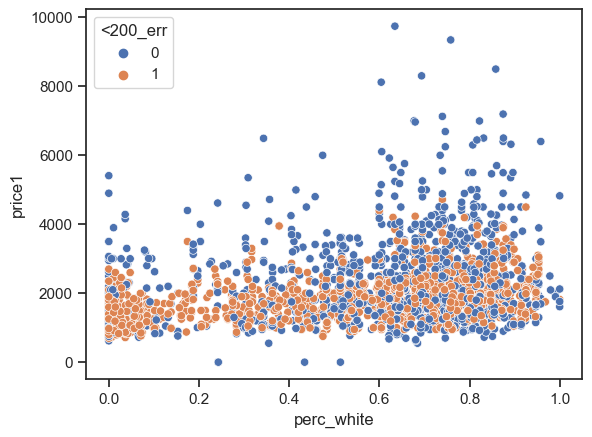

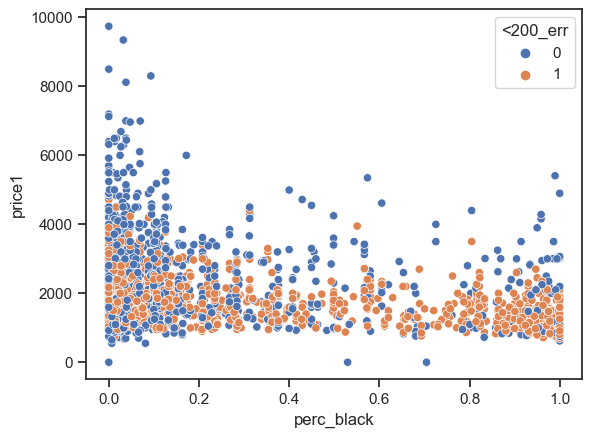

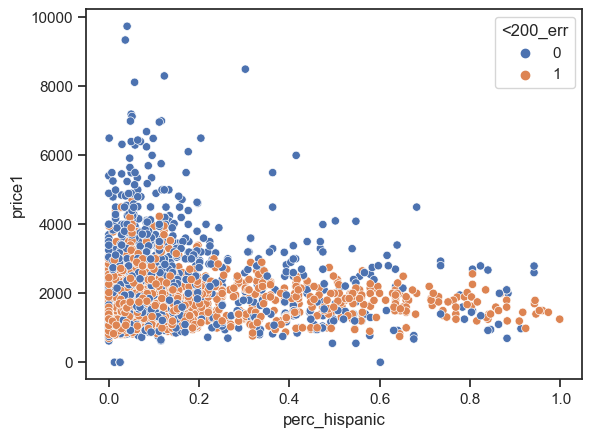

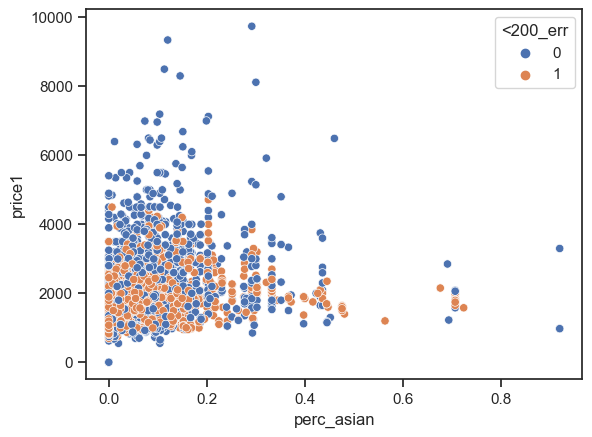

ValueError: Could not interpret value `perc_native` for parameter `x`

In [271]:
for i in hc.iloc[:,1:11].columns:
    sns.scatterplot(x=i, y='price1', data=eval_df, hue='high_price')

    plt.show()

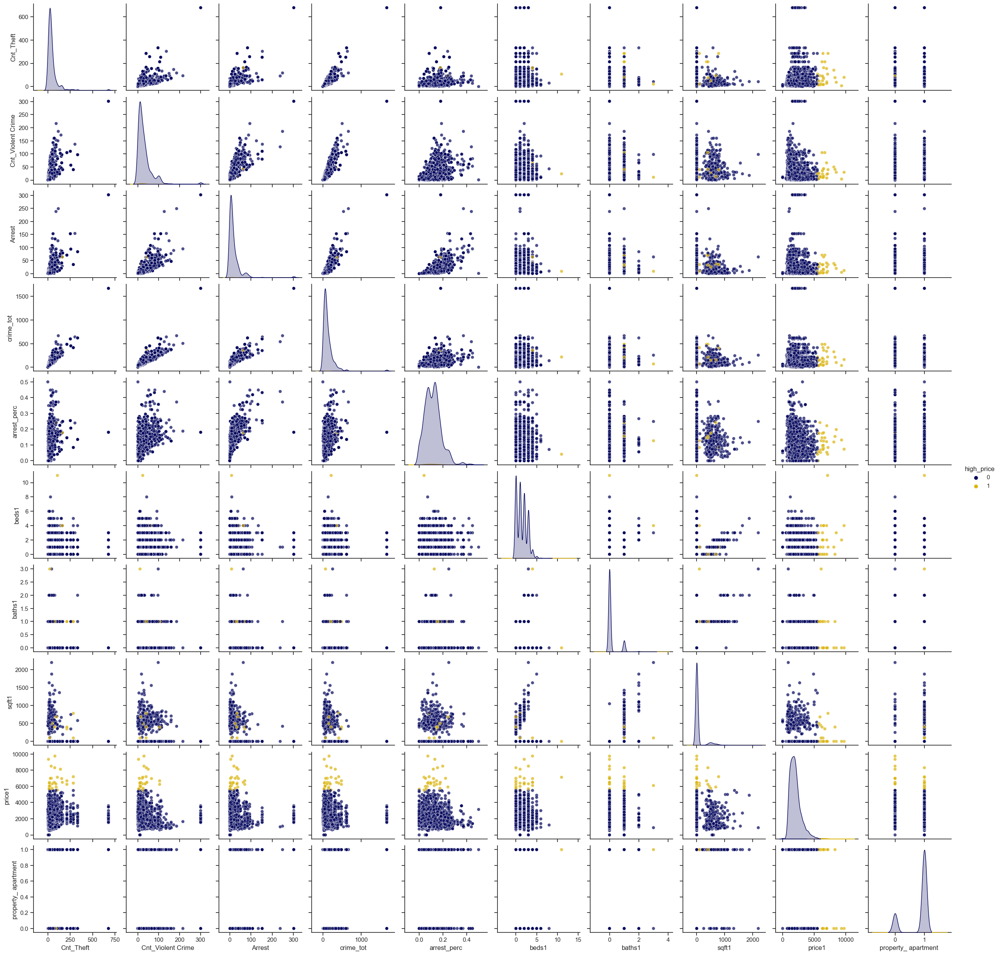

In [297]:
#list of vars to visualize
g = list(hc.iloc[:,20:30].columns)
g.append('high_price')


# Checking to see if there are any variable relations that signal a high price
# Checked relations between important features used in the model and there were none
sns.set(style="ticks", color_codes=True);
# Create a custom color palete
palette = sns.xkcd_palette(['dark blue',  'gold'])
# Make the pair plot with a some aesthetic changes
sns.pairplot(hc[g], 
             hue = 'high_price', diag_kind = 'kde', palette= palette, plot_kws=dict(alpha = 0.7),
                   diag_kws=dict(shade=True))


#could prob try a quick model to predict high price properties and check what the important vars would be there

In [310]:
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay

# Split the data into features (X) and target (y)
# use X_train from regression problem
y_train_hc = hc["high_price"]

# Split the data into training and test sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

rfc = RandomForestClassifier(random_state=303)
rfc.fit(X_train, y_train_hc)

pred_hc = rfc.predict(X_train)

accuracy = accuracy_score(y_train_hc, pred_hc)
print("Accuracy:", accuracy)

Accuracy: 0.9944903581267218


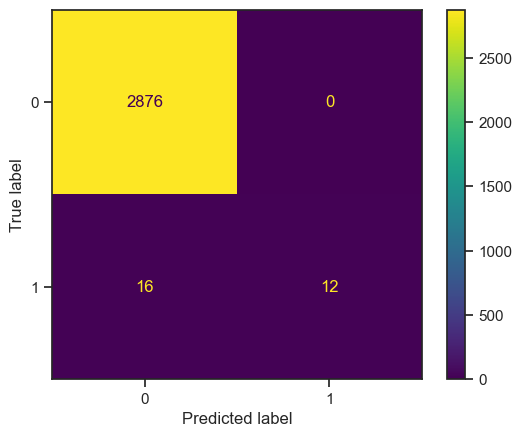

In [312]:
# Create the confusion matrix
cm = confusion_matrix(y_train_hc, pred_hc)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();

Accuracy is high, but confusion matrix shows the model actually does a very poor job in predicting when out target var is true, getting it wrong more than half the time. Classes are deeply unbalanced. Maybe balance and try again.

In [308]:
#Feature Importance
# impurity importance...mean decrease impurity

z_hc = pd.DataFrame(X.columns, rfc.feature_importances_ ).reset_index()\
.rename(columns={"index":"importance", "0":"feature"}) \
.sort_values("importance", ascending=False)

z_hc.head(10)



,importance,0
25,0.199113,beds1
28,0.058423,property_ apartment
30,0.057812,property_ condos
13,0.036632,perc_employed
1,0.033017,perc_white
15,0.030959,pop_density
26,0.030685,baths1
8,0.028425,perc_hsgrad
0,0.026101,ALAND
27,0.024887,sqft1


In [319]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler()
X_uphc, y_uphc = rus.fit_resample(X_train, y_train_hc)
y_uphc.value_counts()

0    28
1    28
Name: high_price, dtype: int64

In [320]:
y_train_hc.value_counts()

0    2876
1      28
Name: high_price, dtype: int64

In [321]:
rfc2 = RandomForestClassifier(random_state=303)
rfc2.fit(X_uphc, y_uphc)

pred_hc2 = rfc2.predict(X_uphc)

accuracy = accuracy_score(y_uphc, pred_hc2)
print("Accuracy:", accuracy)

Accuracy: 0.9821428571428571


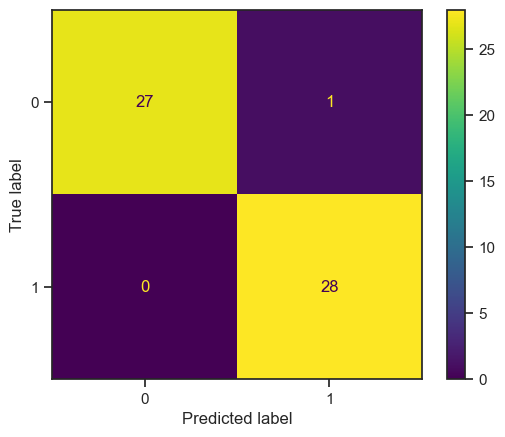

In [322]:
cm = confusion_matrix(y_uphc, pred_hc2)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

In [323]:
# have to break up into a test set to actually see the model accuracy.


2753    1747.0
2703    1780.0
1603    4397.0
2927    1495.0
3236    1991.0
         ...  
2065    1395.0
2996    1941.0
623     1949.0
3150    1000.0
3509    1400.0
Name: price1, Length: 1245, dtype: float64

Some ideas for feature engineering:
for missing numerical info, replace with median (or mode) AND create a new categorical variable (0,1) indicating if that numerical feature had missing info

for missing cat info, replace with missing

log normal transform of skewed numerical features and target

## Next Steps
look at accuracy based on test set
format test set so can do these other analysis
try the above feature engineering techniques, specifically with our strong variables in mind
* an added feature that indicates if price, beds, and baths is direct number or was taken from a range.